In [26]:
import pandas as pd
import numpy as np
import glob
import matplotlib as mpl
import matplotlib.pyplot as plt
from datetime import datetime
import seaborn as sns
from plotly.subplots import make_subplots

mpl.rcParams['figure.figsize'] = (8,6)
mpl.rcParams['axes.grid'] = False

### Importing Data 

In [2]:
directory1 = 'E:/dataset_project/empathy/EyeT/dataset_II/'

#loading all the csv files
files_path1 = glob.glob(directory1 + "/*.csv")
all_dfss = []

for file in files_path1:
    df = pd.read_csv(file)
    all_dfss.append(df)

df2 = pd.concat(all_dfss, ignore_index=True)

print(df2)


        Unnamed: 0  Recording timestamp  Computer timestamp       Sensor  \
0              672              4794663        613406823542          NaN   
1              673              4794663        613406823542          NaN   
2              674              4795431        613406824310  Eye Tracker   
3              675              4803692        613406832571  Eye Tracker   
4              676              4812026        613406840905  Eye Tracker   
...            ...                  ...                 ...          ...   
460125       31731             65940337       1666203561855          NaN   
460126       31732             65945534       1666203567052  Eye Tracker   
460127       31733             65953860       1666203575378  Eye Tracker   
460128       31734             65962157       1666203583675  Eye Tracker   
460129       31735             65970492       1666203592010  Eye Tracker   

           Project name Export date Participant name Recording name  \
0       Particip

In [3]:
df2.shape

(460130, 71)

# working with dataset2

In [4]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 460130 entries, 0 to 460129
Data columns (total 71 columns):
 #   Column                               Non-Null Count   Dtype  
---  ------                               --------------   -----  
 0   Unnamed: 0                           460130 non-null  int64  
 1   Recording timestamp                  460130 non-null  int64  
 2   Computer timestamp                   460130 non-null  int64  
 3   Sensor                               459365 non-null  object 
 4   Project name                         460130 non-null  object 
 5   Export date                          460130 non-null  object 
 6   Participant name                     460130 non-null  object 
 7   Recording name                       460130 non-null  object 
 8   Recording date                       460130 non-null  object 
 9   Recording date UTC                   460130 non-null  object 
 10  Recording start time                 460130 non-null  object 
 11  Recording sta

In [5]:
sample_df2 = df2.copy()

In [6]:
sample_df2.head()

,Unnamed: 0,Recording timestamp,Computer timestamp,Sensor,Project name,Export date,Participant name,Recording name,Recording date,Recording date UTC,...,Original Media height,Eye movement type,Gaze event duration,Eye movement type index,Fixation point X,Fixation point Y,Fixation point X (MCSnorm),Fixation point Y (MCSnorm),Mouse position X,Mouse position Y
0,672,4794663,613406823542,NaN,Participant0024,10.02.2021,Participant0024,Recording1,10.02.2021,10.02.2021,...,NaN,Unclassified,17.0,49.0,NaN,NaN,NaN,NaN,NaN,NaN
1,673,4794663,613406823542,NaN,Participant0024,10.02.2021,Participant0024,Recording1,10.02.2021,10.02.2021,...,NaN,Unclassified,17.0,49.0,NaN,NaN,NaN,NaN,NaN,NaN
2,674,4795431,613406824310,Eye Tracker,Participant0024,10.02.2021,Participant0024,Recording1,10.02.2021,10.02.2021,...,416.0,Unclassified,17.0,49.0,NaN,NaN,NaN,NaN,NaN,NaN
3,675,4803692,613406832571,Eye Tracker,Participant0024,10.02.2021,Participant0024,Recording1,10.02.2021,10.02.2021,...,416.0,Unclassified,17.0,49.0,NaN,NaN,NaN,NaN,NaN,NaN
4,676,4812026,613406840905,Eye Tracker,Participant0024,10.02.2021,Participant0024,Recording1,10.02.2021,10.02.2021,...,416.0,EyesNotFound,8.0,40.0,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
## converting all the datatypes with the actual data types


# Converting these columns into datetime their unit are milisecond
ml_date_cols = ['Recording timestamp', 'Computer timestamp', 'Recording duration', 'Eyetracker timestamp']

for col in ml_date_cols:
    sample_df2[col] = pd.to_datetime(sample_df2[col], unit='ms')


# Converting these columns into datetime 
date_cols = ['Export date', 'Recording date', 'Recording date UTC', 'Recording start time', 'Recording start time UTC']

for col in date_cols:
    sample_df2[col] = pd.to_datetime(sample_df2[col])


# Converting these columns into float and replace the (,) with the decimal point (.)

split_cols = ['Gaze direction left X','Gaze direction left Y','Gaze direction left Z','Gaze direction right X','Gaze direction right Y','Gaze direction right Z',
           'Pupil diameter left','Pupil diameter right','Eye position left X (DACSmm)','Eye position left Y (DACSmm)','Eye position left Z (DACSmm)',
           'Eye position right X (DACSmm)','Eye position right Y (DACSmm)','Eye position right Z (DACSmm)','Gaze point left X (DACSmm)',
           'Gaze point left Y (DACSmm)','Gaze point right X (DACSmm)','Gaze point right Y (DACSmm)','Gaze point X (MCSnorm)','Gaze point Y (MCSnorm)',
           'Gaze point left X (MCSnorm)','Gaze point left Y (MCSnorm)','Gaze point right X (MCSnorm)','Gaze point right Y (MCSnorm)',
           'Fixation point X (MCSnorm)','Fixation point Y (MCSnorm)'
       ]

for column in split_cols:
    sample_df2[column] =sample_df2[column].str.replace(',', '.').astype(float)
    

C:\Users\Rizwan\anaconda3\lib\site-packages\pandas\core\tools\datetimes.py:1047: UserWarning: Parsing '30.09.2020' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  cache_array = _maybe_cache(arg, format, cache, convert_listlike)
C:\Users\Rizwan\anaconda3\lib\site-packages\pandas\core\tools\datetimes.py:1047: UserWarning: Parsing '24.08.2021' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  cache_array = _maybe_cache(arg, format, cache, convert_listlike)
C:\Users\Rizwan\anaconda3\lib\site-packages\pandas\core\tools\datetimes.py:1047: UserWarning: Parsing '17.09.2021' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  cache_array = _maybe_cache(arg, format, cache, convert_listlike)
C:\Users\Rizwan\anaconda3\lib\site-packages\pandas\core\tools\datetimes.py:1047: UserWarning: Parsing '20.09.2021' in DD/MM/YYYY format. Provide format or sp

In [8]:
sample_df2.head()

,Unnamed: 0,Recording timestamp,Computer timestamp,Sensor,Project name,Export date,Participant name,Recording name,Recording date,Recording date UTC,...,Original Media height,Eye movement type,Gaze event duration,Eye movement type index,Fixation point X,Fixation point Y,Fixation point X (MCSnorm),Fixation point Y (MCSnorm),Mouse position X,Mouse position Y
0,672,1970-01-01 01:19:54.663,1989-06-09 14:47:03.542,NaN,Participant0024,2021-10-02,Participant0024,Recording1,2021-10-02,2021-10-02,...,NaN,Unclassified,17.0,49.0,NaN,NaN,NaN,NaN,NaN,NaN
1,673,1970-01-01 01:19:54.663,1989-06-09 14:47:03.542,NaN,Participant0024,2021-10-02,Participant0024,Recording1,2021-10-02,2021-10-02,...,NaN,Unclassified,17.0,49.0,NaN,NaN,NaN,NaN,NaN,NaN
2,674,1970-01-01 01:19:55.431,1989-06-09 14:47:04.310,Eye Tracker,Participant0024,2021-10-02,Participant0024,Recording1,2021-10-02,2021-10-02,...,416.0,Unclassified,17.0,49.0,NaN,NaN,NaN,NaN,NaN,NaN
3,675,1970-01-01 01:20:03.692,1989-06-09 14:47:12.571,Eye Tracker,Participant0024,2021-10-02,Participant0024,Recording1,2021-10-02,2021-10-02,...,416.0,Unclassified,17.0,49.0,NaN,NaN,NaN,NaN,NaN,NaN
4,676,1970-01-01 01:20:12.026,1989-06-09 14:47:20.905,Eye Tracker,Participant0024,2021-10-02,Participant0024,Recording1,2021-10-02,2021-10-02,...,416.0,EyesNotFound,8.0,40.0,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
sample_df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 460130 entries, 0 to 460129
Data columns (total 71 columns):
 #   Column                               Non-Null Count   Dtype         
---  ------                               --------------   -----         
 0   Unnamed: 0                           460130 non-null  int64         
 1   Recording timestamp                  460130 non-null  datetime64[ns]
 2   Computer timestamp                   460130 non-null  datetime64[ns]
 3   Sensor                               459365 non-null  object        
 4   Project name                         460130 non-null  object        
 5   Export date                          460130 non-null  datetime64[ns]
 6   Participant name                     460130 non-null  object        
 7   Recording name                       460130 non-null  object        
 8   Recording date                       460130 non-null  datetime64[ns]
 9   Recording date UTC                   460130 non-null  datetime64[ns]
 

In [10]:
# Set the index to Recording timestamp because this is the time series dataset
sample_df2.set_index('Recording timestamp', inplace=True)

In [11]:
sample_df2.head()

,Unnamed: 0,Computer timestamp,Sensor,Project name,Export date,Participant name,Recording name,Recording date,Recording date UTC,Recording start time,...,Original Media height,Eye movement type,Gaze event duration,Eye movement type index,Fixation point X,Fixation point Y,Fixation point X (MCSnorm),Fixation point Y (MCSnorm),Mouse position X,Mouse position Y
Recording timestamp,,,,,,,,,,,,,,,,,,,,,
1970-01-01 01:19:54.663,672,1989-06-09 14:47:03.542,NaN,Participant0024,2021-10-02,Participant0024,Recording1,2021-10-02,2021-10-02,2023-02-22 13:28:22.410,...,NaN,Unclassified,17.0,49.0,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-01 01:19:54.663,673,1989-06-09 14:47:03.542,NaN,Participant0024,2021-10-02,Participant0024,Recording1,2021-10-02,2021-10-02,2023-02-22 13:28:22.410,...,NaN,Unclassified,17.0,49.0,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-01 01:19:55.431,674,1989-06-09 14:47:04.310,Eye Tracker,Participant0024,2021-10-02,Participant0024,Recording1,2021-10-02,2021-10-02,2023-02-22 13:28:22.410,...,416.0,Unclassified,17.0,49.0,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-01 01:20:03.692,675,1989-06-09 14:47:12.571,Eye Tracker,Participant0024,2021-10-02,Participant0024,Recording1,2021-10-02,2021-10-02,2023-02-22 13:28:22.410,...,416.0,Unclassified,17.0,49.0,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-01 01:20:12.026,676,1989-06-09 14:47:20.905,Eye Tracker,Participant0024,2021-10-02,Participant0024,Recording1,2021-10-02,2021-10-02,2023-02-22 13:28:22.410,...,416.0,EyesNotFound,8.0,40.0,NaN,NaN,NaN,NaN,NaN,NaN


Recording timestamp is successfully set as a index 

In [12]:
#Now we are finding the columns which has no change occur
groups = sample_df2.groupby('Participant name')

for name, group in groups:
    no_change_cols = []
    for column in group.columns:
        if group[column].nunique() == 1:
            no_change_cols.append(column)
            
    print(f"Group: {name}")
    print(f"Columns with no change in values: {no_change_cols}")
    

Group: Participant0002
Columns with no change in values: ['Project name', 'Participant name', 'Recording date', 'Recording date UTC', 'Timeline name', 'Recording Fixation filter name', 'Recording software version', 'Recording resolution height', 'Recording resolution width', 'Recording monitor latency']
Group: Participant0004
Columns with no change in values: ['Project name', 'Participant name', 'Recording date', 'Recording date UTC', 'Timeline name', 'Recording Fixation filter name', 'Recording software version', 'Recording resolution height', 'Recording resolution width', 'Recording monitor latency']
Group: Participant0006
Columns with no change in values: ['Project name', 'Participant name', 'Recording date', 'Recording date UTC', 'Timeline name', 'Recording Fixation filter name', 'Recording software version', 'Recording resolution height', 'Recording resolution width', 'Recording monitor latency', 'Presented Media height', 'Presented Media position Y (DACSpx)']
Group: Participant00

We group the data by participants name because we have more than one participants in which had done trails and every participans has different features which might not change because few participants shows different images which has different resolutions for this reason we can not drop those columns together we will check the columns which has no change for all the participants 

In [13]:
#we check the columns for all participants which has the no change in values 

no_change_cols = []

for col in sample_df2.columns:
    if len(sample_df2[col].unique()) == 1:
        no_change_cols.append(col)

# print the list of column names
print("Columns with no change in values:", no_change_cols)

Columns with no change in values: ['Recording Fixation filter name', 'Recording software version', 'Recording resolution height', 'Recording resolution width', 'Recording monitor latency']


In [14]:
#Removing these columns which has no change
sample_df2 = sample_df2.drop(['Project name', 'Recording Fixation filter name', 'Recording software version', 'Recording resolution height', 'Recording resolution width', 'Recording monitor latency','Unnamed: 0'], axis=1)
sample_df2.head()

,Computer timestamp,Sensor,Export date,Participant name,Recording name,Recording date,Recording date UTC,Recording start time,Recording start time UTC,Recording duration,...,Original Media height,Eye movement type,Gaze event duration,Eye movement type index,Fixation point X,Fixation point Y,Fixation point X (MCSnorm),Fixation point Y (MCSnorm),Mouse position X,Mouse position Y
Recording timestamp,,,,,,,,,,,,,,,,,,,,,
1970-01-01 01:19:54.663,1989-06-09 14:47:03.542,NaN,2021-10-02,Participant0024,Recording1,2021-10-02,2021-10-02,2023-02-22 13:28:22.410,2023-02-22 12:28:22.410,1970-01-01 00:01:30.961,...,NaN,Unclassified,17.0,49.0,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-01 01:19:54.663,1989-06-09 14:47:03.542,NaN,2021-10-02,Participant0024,Recording1,2021-10-02,2021-10-02,2023-02-22 13:28:22.410,2023-02-22 12:28:22.410,1970-01-01 00:01:30.961,...,NaN,Unclassified,17.0,49.0,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-01 01:19:55.431,1989-06-09 14:47:04.310,Eye Tracker,2021-10-02,Participant0024,Recording1,2021-10-02,2021-10-02,2023-02-22 13:28:22.410,2023-02-22 12:28:22.410,1970-01-01 00:01:30.961,...,416.0,Unclassified,17.0,49.0,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-01 01:20:03.692,1989-06-09 14:47:12.571,Eye Tracker,2021-10-02,Participant0024,Recording1,2021-10-02,2021-10-02,2023-02-22 13:28:22.410,2023-02-22 12:28:22.410,1970-01-01 00:01:30.961,...,416.0,Unclassified,17.0,49.0,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-01 01:20:12.026,1989-06-09 14:47:20.905,Eye Tracker,2021-10-02,Participant0024,Recording1,2021-10-02,2021-10-02,2023-02-22 13:28:22.410,2023-02-22 12:28:22.410,1970-01-01 00:01:30.961,...,416.0,EyesNotFound,8.0,40.0,NaN,NaN,NaN,NaN,NaN,NaN


### Finding NaN Vaues 

In [15]:
# making a list of all the nan values which are present in out dataset
na_features = [features for features in sample_df2.columns if sample_df2[features].isnull().sum()>1]

for features in na_features:
    print(features, '=', np.round(df[features].isnull().mean(),4)*100, '% Missing Values')

Sensor = 0.04 % Missing Values
Eyetracker timestamp = 1.44 % Missing Values
Event = 99.96000000000001 % Missing Values
Event value = 99.97 % Missing Values
Gaze point X = 11.75 % Missing Values
Gaze point Y = 11.75 % Missing Values
Gaze point left X = 17.2 % Missing Values
Gaze point left Y = 17.2 % Missing Values
Gaze point right X = 16.73 % Missing Values
Gaze point right Y = 16.73 % Missing Values
Gaze direction left X = 17.2 % Missing Values
Gaze direction left Y = 17.2 % Missing Values
Gaze direction left Z = 17.2 % Missing Values
Gaze direction right X = 16.73 % Missing Values
Gaze direction right Y = 16.73 % Missing Values
Gaze direction right Z = 16.73 % Missing Values
Pupil diameter left = 71.5 % Missing Values
Pupil diameter right = 71.57 % Missing Values
Validity left = 1.44 % Missing Values
Validity right = 1.44 % Missing Values
Eye position left X (DACSmm) = 17.2 % Missing Values
Eye position left Y (DACSmm) = 17.2 % Missing Values
Eye position left Z (DACSmm) = 17.2 % Mis

[Event, Event value, Mouse position X, Mouse position Y] These all columns have almost more than 98% data is missing so we will drop those columns

In [16]:
sample_df2 = sample_df2.drop(['Event', 'Event value', 'Mouse position X', 'Mouse position Y'] , axis=1)

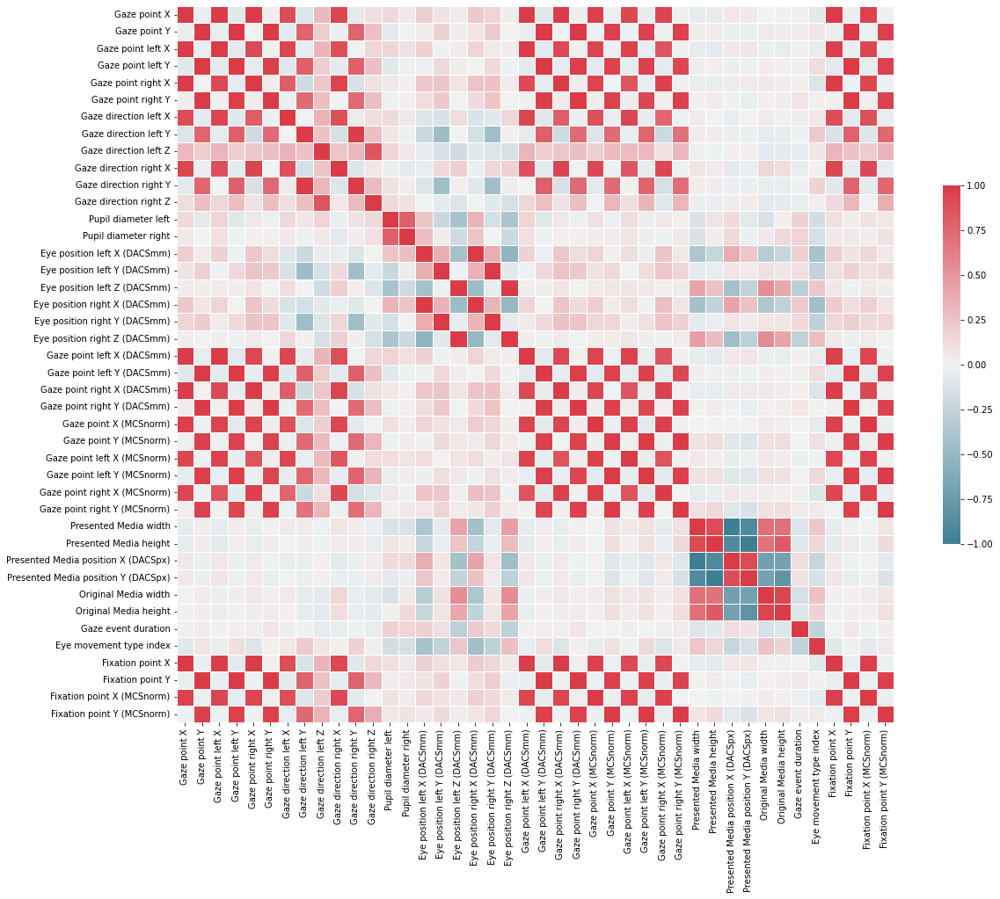

In [17]:
#using heatmap we are trying to see the correlation between columns
corr = sample_df2.corr()

f, ax = plt.subplots(figsize=(20, 15))

cmap = sns.diverging_palette(220, 10, as_cmap=True)

sns.heatmap(corr, cmap=cmap, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.show()

In [18]:
# we are finding the correlation between the columns with a threashold of 0.8
import pandas as pd

corr_matrix = sample_df2.corr()

corr_threshold = 0.8
corr_pairs = []
for col1 in corr_matrix.columns:
    for col2 in corr_matrix.columns:
        if col1 != col2 and abs(corr_matrix.loc[col1, col2]) > corr_threshold:
            corr_pairs.append((col1, col2))

corr_pairs

[('Gaze point X', 'Gaze point left X'),
 ('Gaze point X', 'Gaze point right X'),
 ('Gaze point X', 'Gaze direction left X'),
 ('Gaze point X', 'Gaze direction right X'),
 ('Gaze point X', 'Gaze point left X (DACSmm)'),
 ('Gaze point X', 'Gaze point right X (DACSmm)'),
 ('Gaze point X', 'Gaze point X (MCSnorm)'),
 ('Gaze point X', 'Gaze point left X (MCSnorm)'),
 ('Gaze point X', 'Gaze point right X (MCSnorm)'),
 ('Gaze point X', 'Fixation point X'),
 ('Gaze point X', 'Fixation point X (MCSnorm)'),
 ('Gaze point Y', 'Gaze point left Y'),
 ('Gaze point Y', 'Gaze point right Y'),
 ('Gaze point Y', 'Gaze point left Y (DACSmm)'),
 ('Gaze point Y', 'Gaze point right Y (DACSmm)'),
 ('Gaze point Y', 'Gaze point Y (MCSnorm)'),
 ('Gaze point Y', 'Gaze point left Y (MCSnorm)'),
 ('Gaze point Y', 'Gaze point right Y (MCSnorm)'),
 ('Gaze point Y', 'Fixation point Y'),
 ('Gaze point Y', 'Fixation point Y (MCSnorm)'),
 ('Gaze point left X', 'Gaze point X'),
 ('Gaze point left X', 'Gaze point right X'

We have observed that above columns has high correlation with each other like Gaze point X with Gaze point left X and so on..

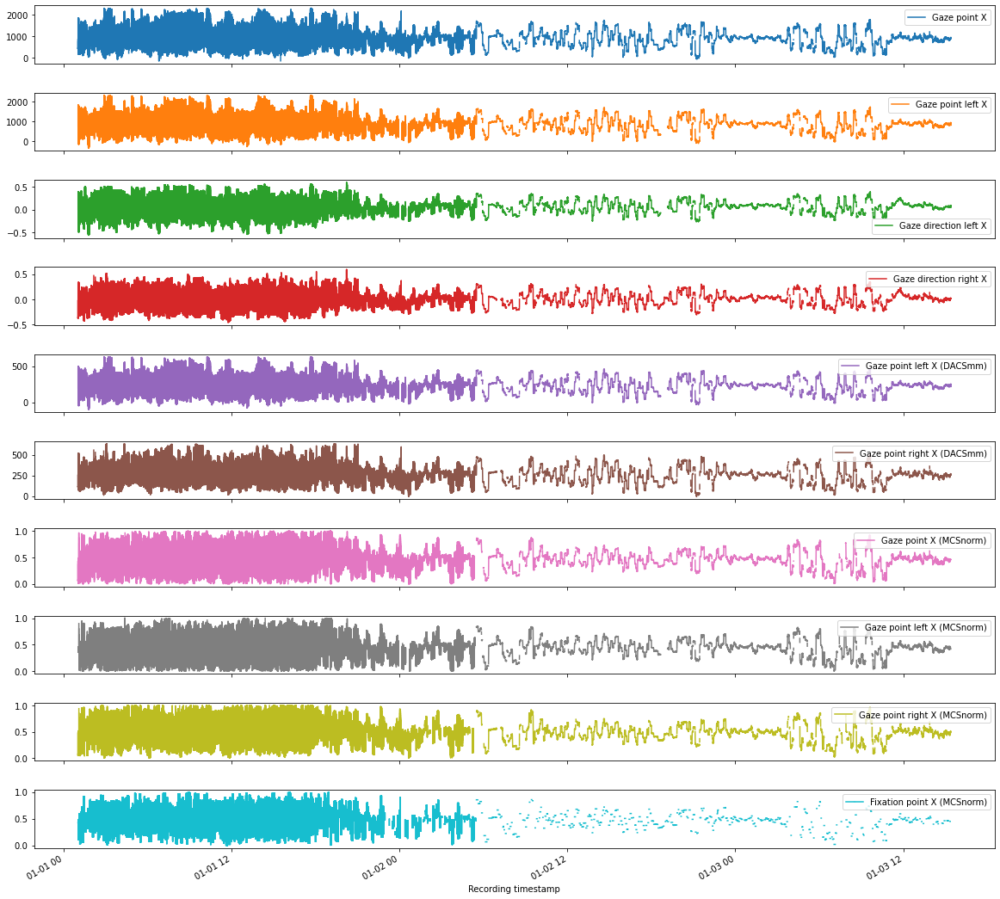

In [42]:
# we are plotting the data to check the relationship between ['Gaze point X'] with ['Gaze point left X','Gaze direction left X','Gaze direction right X','Gaze point left X (DACSmm)',
#                    'Gaze point right X (DACSmm)','Gaze point X (MCSnorm)','Gaze point left X (MCSnorm)','Gaze point right X (MCSnorm)',
#                   'Fixation point X (MCSnorm)']

show_data = sample_df2[['Gaze point X','Gaze point left X','Gaze direction left X','Gaze direction right X','Gaze point left X (DACSmm)',
                   'Gaze point right X (DACSmm)','Gaze point X (MCSnorm)','Gaze point left X (MCSnorm)','Gaze point right X (MCSnorm)',
                   'Fixation point X (MCSnorm)']]


show_data.plot(subplots=True, figsize=(20, 20))
plt.subplots_adjust(hspace=0.5)


As we seen that above graphs showing somehow the same patterns between each other but there are some missing values in this which effect the pattern of the graph as it clearly can be seen in the last graph we need to do some imputation to remove missing values

In [19]:
# lets check how many total missing data we have

miss_count = sample_df2.isna().sum()
total_na = miss_count.sum()
print(f'Total NaN values: {total_na}')


Total NaN values: 4089796


we have total 4089796 missing data now we fill those NaN values with backward and forward fill technique

In [20]:
#we are doing imputation to remove the missing data by backward and forward fill technique
sample_df2.interpolate(method='ffill', inplace=True)
sample_df2.interpolate(method='bfill', inplace=True)

In [21]:
# lets check again how many total missing data we have

miss_count = sample_df2.isna().sum()
total_na = miss_count.sum()
print(f'Total NaN values: {total_na}')


Total NaN values: 0


now its clearly seen that we have no missing data therefore we are plotting sub plots again to see the trend

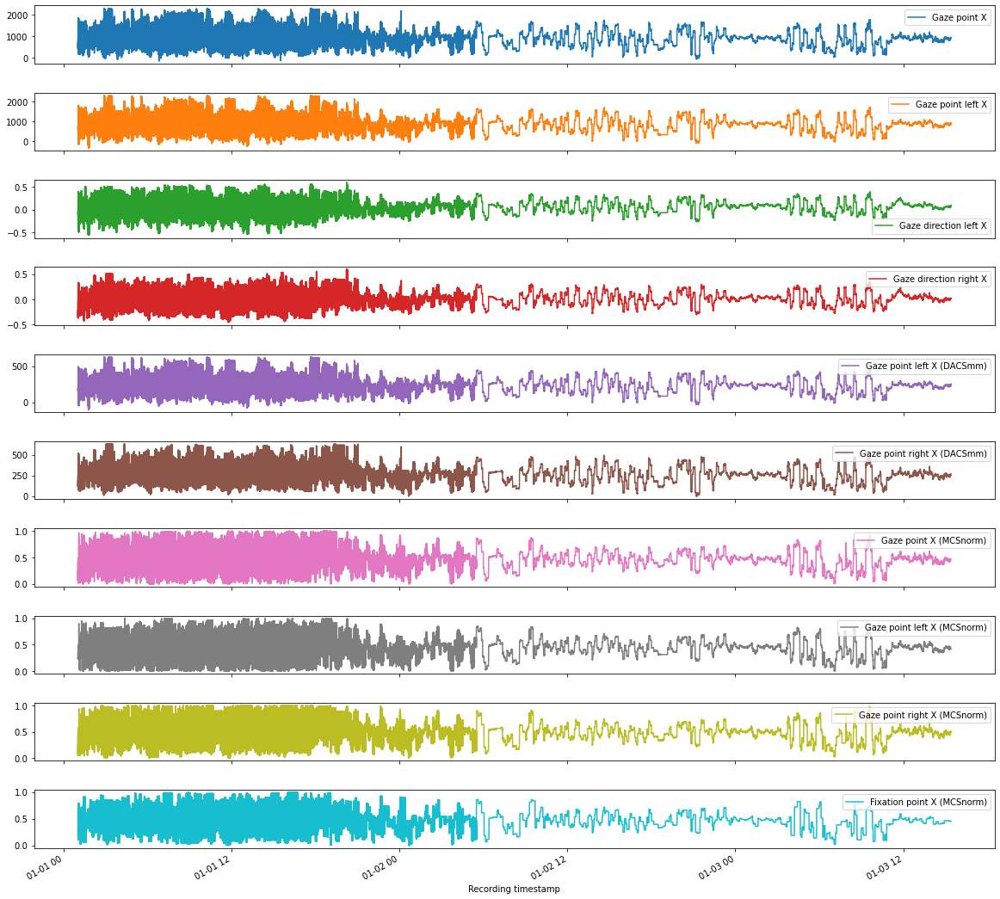

In [46]:
# we are plotting the data to check the relationship between ['Gaze point X'] with ['Gaze point left X','Gaze direction left X','Gaze direction right X','Gaze point left X (DACSmm)',
#                    'Gaze point right X (DACSmm)','Gaze point X (MCSnorm)','Gaze point left X (MCSnorm)','Gaze point right X (MCSnorm)',
#                   'Fixation point X (MCSnorm)']

show_data = sample_df2[['Gaze point X','Gaze point left X','Gaze direction left X','Gaze direction right X','Gaze point left X (DACSmm)',
                   'Gaze point right X (DACSmm)','Gaze point X (MCSnorm)','Gaze point left X (MCSnorm)','Gaze point right X (MCSnorm)',
                   'Fixation point X (MCSnorm)']]

show_data.plot(subplots=True, figsize=(20, 20))
plt.subplots_adjust(hspace=0.5)


It can be seen that every columns has almost following the same trend 

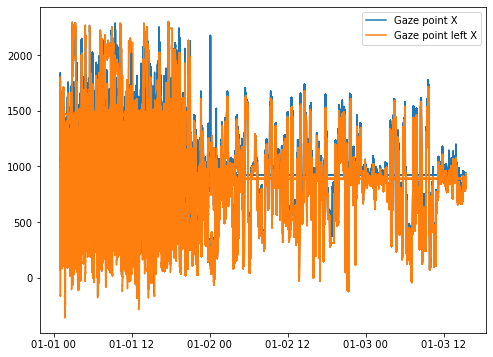

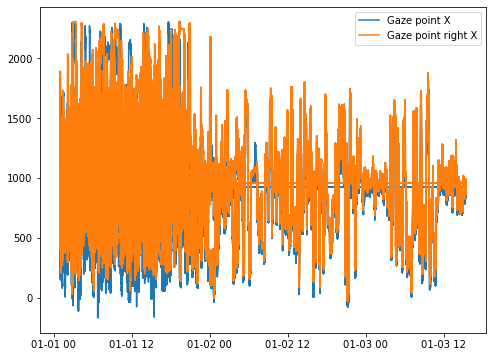

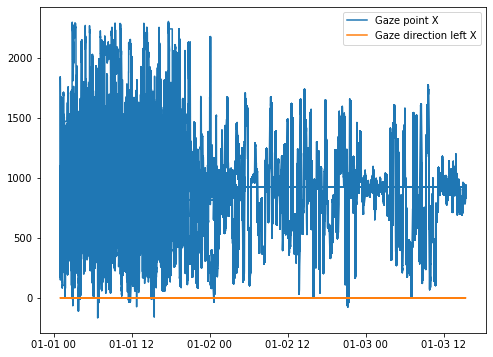

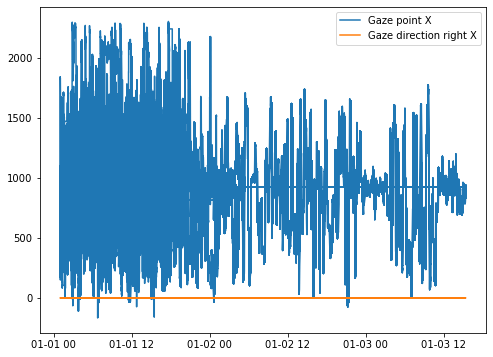

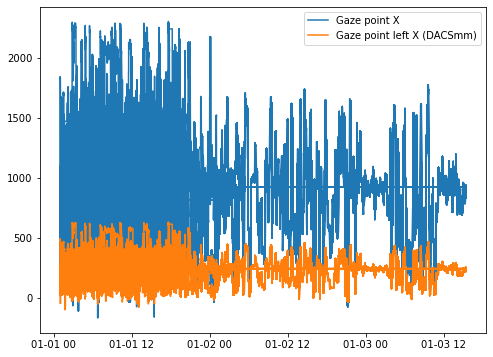

...

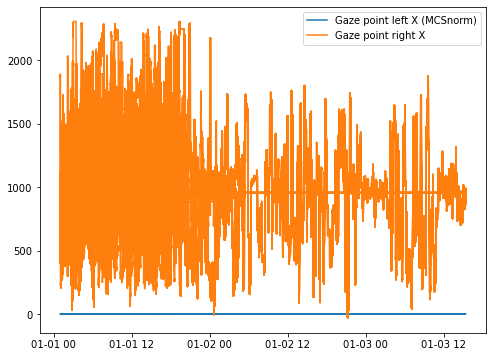

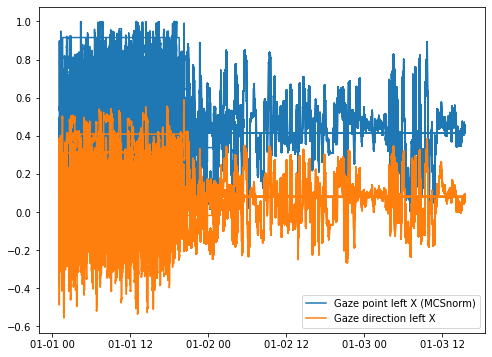

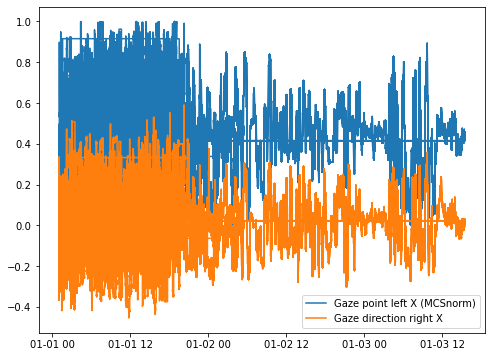

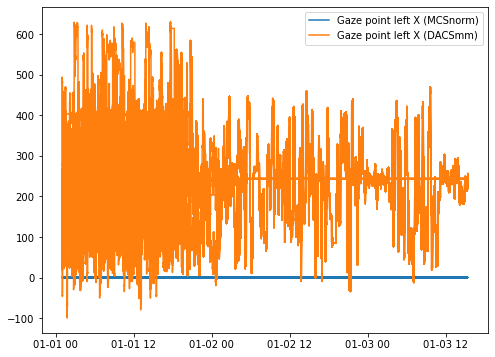

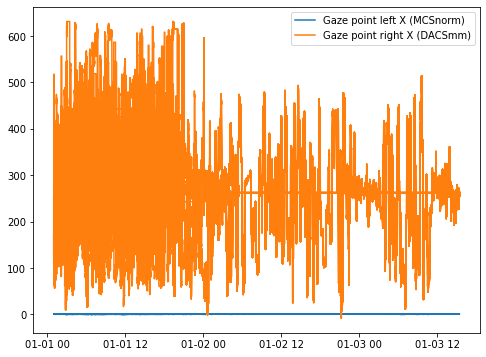

C:\Users\Rizwan\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


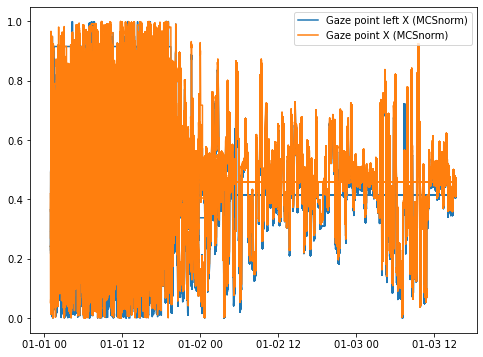

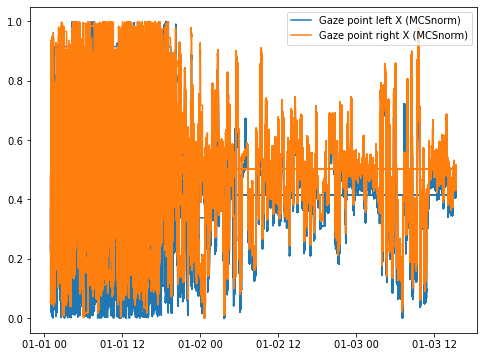

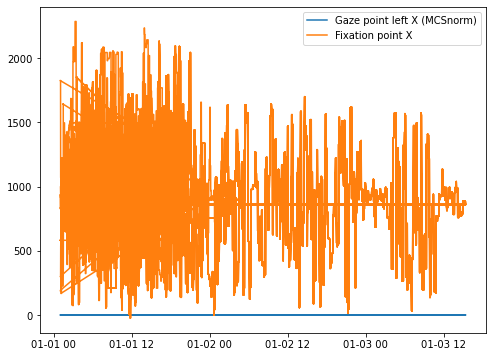

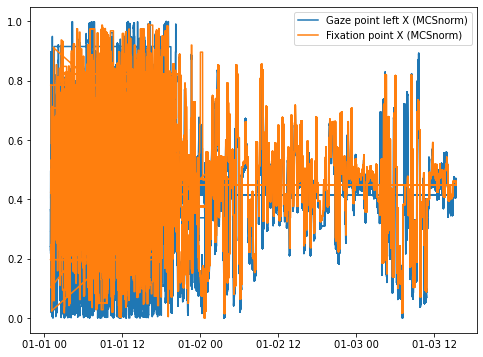

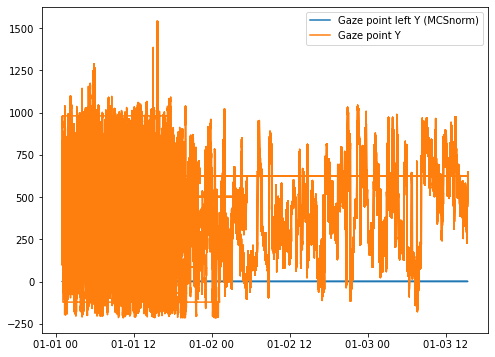

...

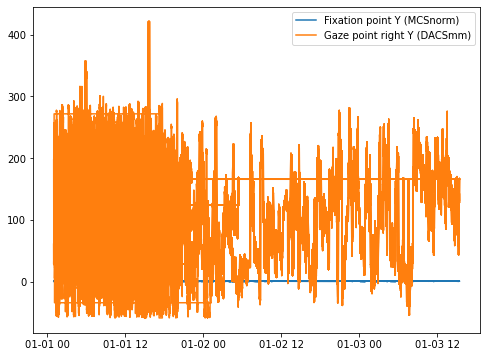

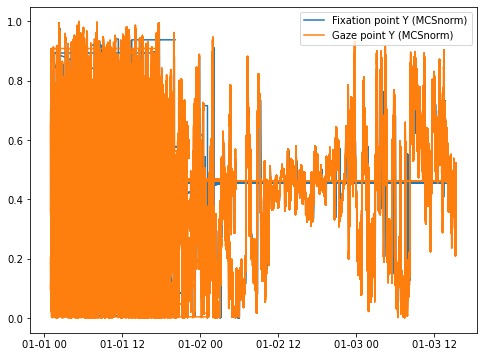

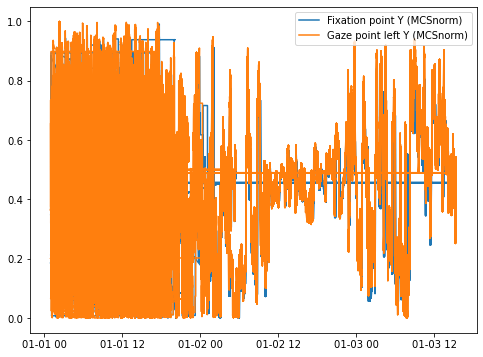

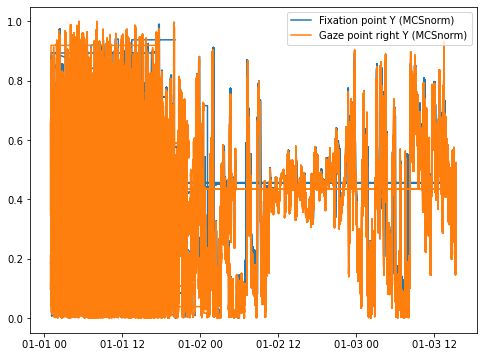

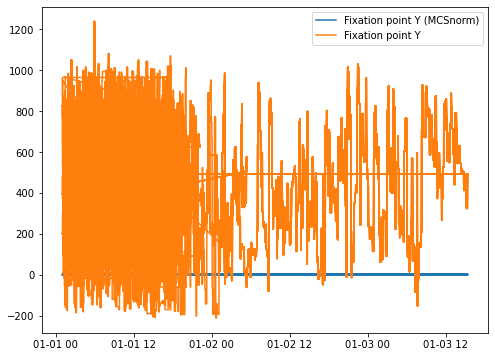

In [50]:
# finding the columns that have the highest correlation with other columns
corr_pairs = []
for col1 in corr_matrix.columns:
    for col2 in corr_matrix.columns:
        if col1 != col2 and abs(corr_matrix.loc[col1, col2]) > corr_threshold:
            corr_pairs.append((col1, col2))

for pair in corr_pairs:
    plt.plot(sample_df2[pair[0]], label=pair[0])
    plt.plot(sample_df2[pair[1]], label=pair[1])
    plt.legend()
    plt.show()


The above plots are showing the trend between each other and it is ploted based on the pairs of columns which are correlated with each other

In [22]:
sample_df2['Participant name'].unique()

array(['Participant0024', 'Participant0002', 'Participant0004',
       'Participant0050', 'Participant0058', 'Participant0060',
       'Participant0006', 'Participant0008', 'Participant0012'],
      dtype=object)

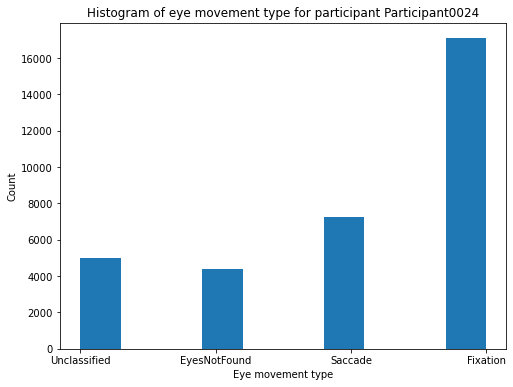

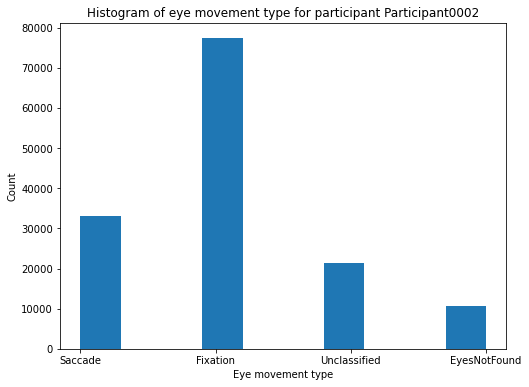

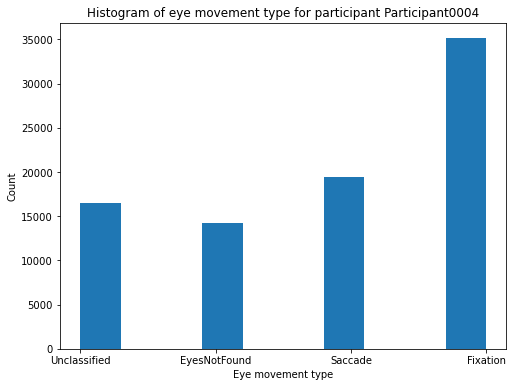

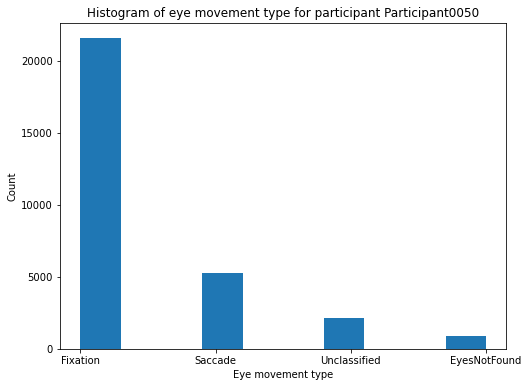

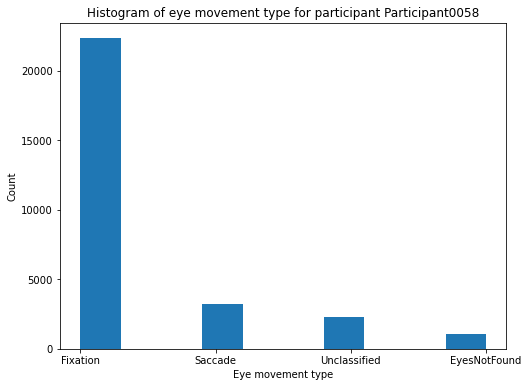

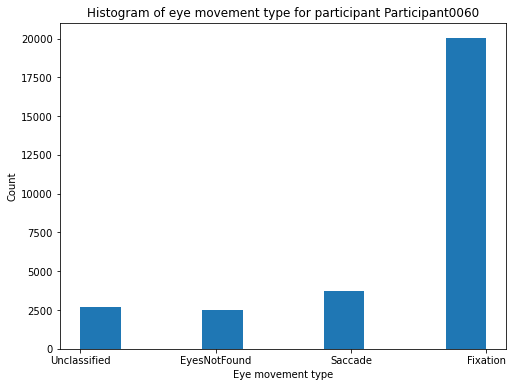

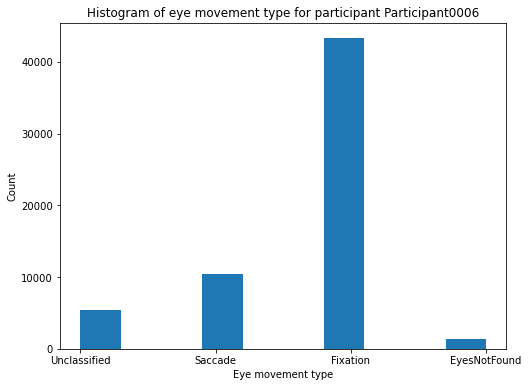

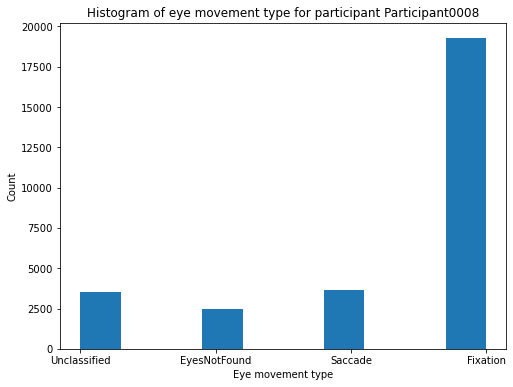

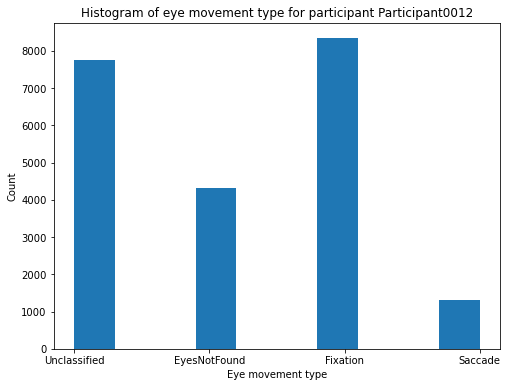

In [23]:
#we are finding the count of eye movement type occur for each participant

participant_col = 'Participant name'

participants = sample_df2[participant_col].unique()

for participant in participants:
    participant_rows = sample_df2[sample_df2[participant_col] == participant]
    
    plt.hist(participant_rows['Eye movement type'])
    plt.title(f"Histogram of eye movement type for participant {participant}")
    plt.xlabel('Eye movement type')
    plt.ylabel('Count')
    plt.show()


It can be clearly seen that every participant done maximum fixation it means they take maximum time in absorbing the information, to identifying the shapes 

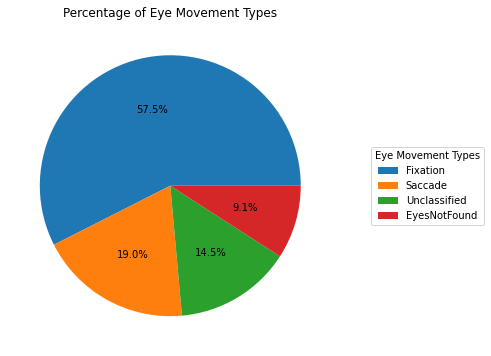

In [24]:
eye_movement_counts = sample_df2['Eye movement type'].value_counts()

plt.pie(eye_movement_counts, labels=None, autopct='%1.1f%%')

plt.legend(eye_movement_counts.index, title='Eye Movement Types', loc='center left', bbox_to_anchor=(1.1, 0.5))

plt.title('Percentage of Eye Movement Types')

plt.show()


above pie chart is showing that the maximum fixation occur 57.5% whereas 19.0% sacade occur 

# working with dataset3

In [5]:
directory = 'E:/dataset_project/empathy/EyeT/dataset_III/'

files_path = glob.glob(directory + "/*.csv")

all_dfs = []

for file in files_path:
    df = pd.read_csv(file)
    all_dfs.append(df)

df3 = pd.concat(all_dfs, ignore_index=True)

print(df3)


C:\Users\Rizwan\AppData\Local\Temp\ipykernel_11608\1305413822.py:12: DtypeWarning: Columns (31,32,33,34,35,41,42,43,46,47,48,49,50,51,52,53,67,68) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file)
C:\Users\Rizwan\AppData\Local\Temp\ipykernel_11608\1305413822.py:12: DtypeWarning: Columns (20,21,34,35,50,51,67,68) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file)
C:\Users\Rizwan\AppData\Local\Temp\ipykernel_11608\1305413822.py:12: DtypeWarning: Columns (20,21) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file)
C:\Users\Rizwan\AppData\Local\Temp\ipykernel_11608\1305413822.py:12: DtypeWarning: Columns (20,21) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file)
C:\Users\Rizwan\AppData\Local\Temp\ipykernel_11608\1305413822.py:12: DtypeWarning: Columns (20,21) have mixed types. Specify dtype option on i

        Unnamed: 0  Recording timestamp  Computer timestamp       Sensor  \
0             3082             23419315           512092386          NaN   
1             3083             23419315           512092386          NaN   
2             3084             23426120           512099191  Eye Tracker   
3             3085             23434449           512107520  Eye Tracker   
4             3086             23442782           512115853  Eye Tracker   
...            ...                  ...                 ...          ...   
970035      100618             74188757           774859965  Eye Tracker   
970036      100619             74197135           774868343  Eye Tracker   
970037      100620             74205245           774876453          NaN   
970038      100621             74205245           774876453        Mouse   
970039      100622             74231266           774902474          NaN   

                 Project name Export date Participant name Recording name  \
0       Te

In [6]:
df3.shape

(970040, 71)

In [4]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 970040 entries, 0 to 970039
Data columns (total 71 columns):
 #   Column                               Non-Null Count   Dtype  
---  ------                               --------------   -----  
 0   Unnamed: 0                           970040 non-null  int64  
 1   Recording timestamp                  970040 non-null  int64  
 2   Computer timestamp                   970040 non-null  int64  
 3   Sensor                               969573 non-null  object 
 4   Project name                         970040 non-null  object 
 5   Export date                          970040 non-null  object 
 6   Participant name                     970040 non-null  object 
 7   Recording name                       970040 non-null  object 
 8   Recording date                       970040 non-null  object 
 9   Recording date UTC                   970040 non-null  object 
 10  Recording start time                 970040 non-null  object 
 11  Recording sta

In [7]:
sample_df3 = df3.copy()

In [8]:
sample_df3.head()

,Unnamed: 0,Recording timestamp,Computer timestamp,Sensor,Project name,Export date,Participant name,Recording name,Recording date,Recording date UTC,...,Original Media height,Eye movement type,Gaze event duration,Eye movement type index,Fixation point X,Fixation point Y,Fixation point X (MCSnorm),Fixation point Y (MCSnorm),Mouse position X,Mouse position Y
0,3082,23419315,512092386,NaN,Test group experiment,29.10.2020,Participant0001,Recording1,24.09.2020,24.09.2020,...,NaN,Fixation,117.0,64.0,971.0,341.0,"0,5073","0,3160",NaN,NaN
1,3083,23419315,512092386,NaN,Test group experiment,29.10.2020,Participant0001,Recording1,24.09.2020,24.09.2020,...,NaN,Fixation,117.0,64.0,971.0,341.0,"0,5073","0,3160",NaN,NaN
2,3084,23426120,512099191,Eye Tracker,Test group experiment,29.10.2020,Participant0001,Recording1,24.09.2020,24.09.2020,...,649.0,Fixation,117.0,64.0,971.0,341.0,"0,5073","0,3160",NaN,NaN
3,3085,23434449,512107520,Eye Tracker,Test group experiment,29.10.2020,Participant0001,Recording1,24.09.2020,24.09.2020,...,649.0,Fixation,117.0,64.0,971.0,341.0,"0,5073","0,3160",NaN,NaN
4,3086,23442782,512115853,Eye Tracker,Test group experiment,29.10.2020,Participant0001,Recording1,24.09.2020,24.09.2020,...,649.0,Fixation,117.0,64.0,971.0,341.0,"0,5073","0,3160",NaN,NaN


In [9]:
## converting all the datatypes with the actual data types


# Converting these columns into datetime their unit are milisecond
ml_date_cols = ['Recording timestamp', 'Computer timestamp', 'Recording duration', 'Eyetracker timestamp']

for col in ml_date_cols:
    sample_df3[col] = pd.to_datetime(sample_df3[col], unit='ms')



# Converting these columns into datetime 
date_cols = ['Export date', 'Recording date', 'Recording date UTC', 'Recording start time', 'Recording start time UTC']

for col in date_cols:
    sample_df3[col] = pd.to_datetime(sample_df3[col])




# Converting these columns into float and replace the (,) with the decimal point (.)

split_cols = ['Gaze direction left X','Gaze direction left Y','Gaze direction left Z','Gaze direction right X','Gaze direction right Y','Gaze direction right Z',
           'Pupil diameter left','Pupil diameter right','Eye position left X (DACSmm)','Eye position left Y (DACSmm)','Eye position left Z (DACSmm)',
           'Eye position right X (DACSmm)','Eye position right Y (DACSmm)','Eye position right Z (DACSmm)','Gaze point left X (DACSmm)',
           'Gaze point left Y (DACSmm)','Gaze point right X (DACSmm)','Gaze point right Y (DACSmm)','Gaze point X (MCSnorm)','Gaze point Y (MCSnorm)',
           'Gaze point left X (MCSnorm)','Gaze point left Y (MCSnorm)','Gaze point right X (MCSnorm)','Gaze point right Y (MCSnorm)',
           'Fixation point X (MCSnorm)','Fixation point Y (MCSnorm)'
       ]

for column in split_cols:
    sample_df3[column] =sample_df3[column].str.replace(',', '.').astype(float)




C:\Users\Rizwan\anaconda3\lib\site-packages\pandas\core\tools\datetimes.py:1047: UserWarning: Parsing '29.10.2020' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  cache_array = _maybe_cache(arg, format, cache, convert_listlike)
C:\Users\Rizwan\anaconda3\lib\site-packages\pandas\core\tools\datetimes.py:1047: UserWarning: Parsing '25.11.2020' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  cache_array = _maybe_cache(arg, format, cache, convert_listlike)
C:\Users\Rizwan\anaconda3\lib\site-packages\pandas\core\tools\datetimes.py:1047: UserWarning: Parsing '24.09.2020' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  cache_array = _maybe_cache(arg, format, cache, convert_listlike)
C:\Users\Rizwan\anaconda3\lib\site-packages\pandas\core\tools\datetimes.py:1047: UserWarning: Parsing '20.10.2020' in DD/MM/YYYY format. Provide format or sp

In [10]:
sample_df3.head()

,Unnamed: 0,Recording timestamp,Computer timestamp,Sensor,Project name,Export date,Participant name,Recording name,Recording date,Recording date UTC,...,Original Media height,Eye movement type,Gaze event duration,Eye movement type index,Fixation point X,Fixation point Y,Fixation point X (MCSnorm),Fixation point Y (MCSnorm),Mouse position X,Mouse position Y
0,3082,1970-01-01 06:30:19.315,1970-01-06 22:14:52.386,NaN,Test group experiment,2020-10-29,Participant0001,Recording1,2020-09-24,2020-09-24,...,NaN,Fixation,117.0,64.0,971.0,341.0,0.5073,0.316,NaN,NaN
1,3083,1970-01-01 06:30:19.315,1970-01-06 22:14:52.386,NaN,Test group experiment,2020-10-29,Participant0001,Recording1,2020-09-24,2020-09-24,...,NaN,Fixation,117.0,64.0,971.0,341.0,0.5073,0.316,NaN,NaN
2,3084,1970-01-01 06:30:26.120,1970-01-06 22:14:59.191,Eye Tracker,Test group experiment,2020-10-29,Participant0001,Recording1,2020-09-24,2020-09-24,...,649.0,Fixation,117.0,64.0,971.0,341.0,0.5073,0.316,NaN,NaN
3,3085,1970-01-01 06:30:34.449,1970-01-06 22:15:07.520,Eye Tracker,Test group experiment,2020-10-29,Participant0001,Recording1,2020-09-24,2020-09-24,...,649.0,Fixation,117.0,64.0,971.0,341.0,0.5073,0.316,NaN,NaN
4,3086,1970-01-01 06:30:42.782,1970-01-06 22:15:15.853,Eye Tracker,Test group experiment,2020-10-29,Participant0001,Recording1,2020-09-24,2020-09-24,...,649.0,Fixation,117.0,64.0,971.0,341.0,0.5073,0.316,NaN,NaN


In [11]:
sample_df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 970040 entries, 0 to 970039
Data columns (total 71 columns):
 #   Column                               Non-Null Count   Dtype         
---  ------                               --------------   -----         
 0   Unnamed: 0                           970040 non-null  int64         
 1   Recording timestamp                  970040 non-null  datetime64[ns]
 2   Computer timestamp                   970040 non-null  datetime64[ns]
 3   Sensor                               969573 non-null  object        
 4   Project name                         970040 non-null  object        
 5   Export date                          970040 non-null  datetime64[ns]
 6   Participant name                     970040 non-null  object        
 7   Recording name                       970040 non-null  object        
 8   Recording date                       970040 non-null  datetime64[ns]
 9   Recording date UTC                   970040 non-null  datetime64[ns]
 

In [12]:
# Set the index to Recording timestamp
sample_df3.set_index('Recording timestamp', inplace=True)

In [13]:
sample_df3.head()

,Unnamed: 0,Computer timestamp,Sensor,Project name,Export date,Participant name,Recording name,Recording date,Recording date UTC,Recording start time,...,Original Media height,Eye movement type,Gaze event duration,Eye movement type index,Fixation point X,Fixation point Y,Fixation point X (MCSnorm),Fixation point Y (MCSnorm),Mouse position X,Mouse position Y
Recording timestamp,,,,,,,,,,,,,,,,,,,,,
1970-01-01 06:30:19.315,3082,1970-01-06 22:14:52.386,NaN,Test group experiment,2020-10-29,Participant0001,Recording1,2020-09-24,2020-09-24,2023-02-21 15:17:34.920,...,NaN,Fixation,117.0,64.0,971.0,341.0,0.5073,0.316,NaN,NaN
1970-01-01 06:30:19.315,3083,1970-01-06 22:14:52.386,NaN,Test group experiment,2020-10-29,Participant0001,Recording1,2020-09-24,2020-09-24,2023-02-21 15:17:34.920,...,NaN,Fixation,117.0,64.0,971.0,341.0,0.5073,0.316,NaN,NaN
1970-01-01 06:30:26.120,3084,1970-01-06 22:14:59.191,Eye Tracker,Test group experiment,2020-10-29,Participant0001,Recording1,2020-09-24,2020-09-24,2023-02-21 15:17:34.920,...,649.0,Fixation,117.0,64.0,971.0,341.0,0.5073,0.316,NaN,NaN
1970-01-01 06:30:34.449,3085,1970-01-06 22:15:07.520,Eye Tracker,Test group experiment,2020-10-29,Participant0001,Recording1,2020-09-24,2020-09-24,2023-02-21 15:17:34.920,...,649.0,Fixation,117.0,64.0,971.0,341.0,0.5073,0.316,NaN,NaN
1970-01-01 06:30:42.782,3086,1970-01-06 22:15:15.853,Eye Tracker,Test group experiment,2020-10-29,Participant0001,Recording1,2020-09-24,2020-09-24,2023-02-21 15:17:34.920,...,649.0,Fixation,117.0,64.0,971.0,341.0,0.5073,0.316,NaN,NaN


Recording timestamp is successfully set as a index 

In [12]:
#Now we are finding the columns which has no change occur

groups = sample_df3.groupby('Participant name')

for name, group in groups:
    no_change_cols = []
    for column in group.columns:
        if group[column].nunique() == 1:
            no_change_cols.append(column)
    print(f"Group: {name}")
    print(f"Columns with no change in values: {no_change_cols}")

Group: Participant0001
Columns with no change in values: ['Project name', 'Participant name', 'Recording date', 'Recording date UTC', 'Timeline name', 'Recording Fixation filter name', 'Recording software version', 'Recording resolution height', 'Recording resolution width', 'Recording monitor latency', 'Presented Stimulus name', 'Presented Media name', 'Presented Media width', 'Presented Media height', 'Presented Media position X (DACSpx)', 'Presented Media position Y (DACSpx)', 'Original Media width', 'Original Media height']
Group: Participant0003
Columns with no change in values: ['Project name', 'Participant name', 'Recording date', 'Recording date UTC', 'Timeline name', 'Recording Fixation filter name', 'Recording software version', 'Recording resolution height', 'Recording resolution width', 'Recording monitor latency', 'Presented Stimulus name', 'Presented Media name', 'Presented Media width', 'Presented Media height', 'Presented Media position X (DACSpx)', 'Presented Media pos

We group the data by participants name because we have more than one participants in which had done trails and every participans has different features which might not change because few participants shows different images which has different resolutions for this reason we can not drop those columns together we will check the columns which has no change for all the participants

In [14]:
#we check the columns for all participants which has the no change in values 

no_change_cols = []

for col in sample_df3.columns:
    if len(sample_df3[col].unique()) == 1:
        no_change_cols.append(col)

print("Columns with no change in values:", no_change_cols)

Columns with no change in values: ['Recording Fixation filter name', 'Recording software version', 'Recording resolution height', 'Recording resolution width', 'Recording monitor latency']


In [15]:
#Removing these columns which has no change
sample_df3 = sample_df3.drop(['Project name', 'Recording Fixation filter name', 'Recording software version', 'Recording resolution height', 'Recording resolution width', 'Recording monitor latency','Unnamed: 0'], axis=1)
sample_df3.head()

,Computer timestamp,Sensor,Export date,Participant name,Recording name,Recording date,Recording date UTC,Recording start time,Recording start time UTC,Recording duration,...,Original Media height,Eye movement type,Gaze event duration,Eye movement type index,Fixation point X,Fixation point Y,Fixation point X (MCSnorm),Fixation point Y (MCSnorm),Mouse position X,Mouse position Y
Recording timestamp,,,,,,,,,,,,,,,,,,,,,
1970-01-01 06:30:19.315,1970-01-06 22:14:52.386,NaN,2020-10-29,Participant0001,Recording1,2020-09-24,2020-09-24,2023-02-21 15:17:34.920,2023-02-21 13:17:34.920,1970-01-01 00:01:23.579,...,NaN,Fixation,117.0,64.0,971.0,341.0,0.5073,0.316,NaN,NaN
1970-01-01 06:30:19.315,1970-01-06 22:14:52.386,NaN,2020-10-29,Participant0001,Recording1,2020-09-24,2020-09-24,2023-02-21 15:17:34.920,2023-02-21 13:17:34.920,1970-01-01 00:01:23.579,...,NaN,Fixation,117.0,64.0,971.0,341.0,0.5073,0.316,NaN,NaN
1970-01-01 06:30:26.120,1970-01-06 22:14:59.191,Eye Tracker,2020-10-29,Participant0001,Recording1,2020-09-24,2020-09-24,2023-02-21 15:17:34.920,2023-02-21 13:17:34.920,1970-01-01 00:01:23.579,...,649.0,Fixation,117.0,64.0,971.0,341.0,0.5073,0.316,NaN,NaN
1970-01-01 06:30:34.449,1970-01-06 22:15:07.520,Eye Tracker,2020-10-29,Participant0001,Recording1,2020-09-24,2020-09-24,2023-02-21 15:17:34.920,2023-02-21 13:17:34.920,1970-01-01 00:01:23.579,...,649.0,Fixation,117.0,64.0,971.0,341.0,0.5073,0.316,NaN,NaN
1970-01-01 06:30:42.782,1970-01-06 22:15:15.853,Eye Tracker,2020-10-29,Participant0001,Recording1,2020-09-24,2020-09-24,2023-02-21 15:17:34.920,2023-02-21 13:17:34.920,1970-01-01 00:01:23.579,...,649.0,Fixation,117.0,64.0,971.0,341.0,0.5073,0.316,NaN,NaN


### Finding NaN Vaues 


In [16]:
# making a list of all the nan values which are present in out dataset
na_features = [features for features in sample_df3.columns if sample_df3[features].isnull().sum()>1]

for features in na_features:
    print(features, '=', np.round(df[features].isnull().mean(),4)*100, '% Missing Values')

Sensor = 0.06 % Missing Values
Eyetracker timestamp = 1.35 % Missing Values
Event = 99.94 % Missing Values
Event value = 99.95 % Missing Values
Gaze point X = 6.64 % Missing Values
Gaze point Y = 6.64 % Missing Values
Gaze point left X = 12.61 % Missing Values
Gaze point left Y = 12.61 % Missing Values
Gaze point right X = 12.04 % Missing Values
Gaze point right Y = 12.04 % Missing Values
Gaze direction left X = 12.61 % Missing Values
Gaze direction left Y = 12.61 % Missing Values
Gaze direction left Z = 12.61 % Missing Values
Gaze direction right X = 12.04 % Missing Values
Gaze direction right Y = 12.04 % Missing Values
Gaze direction right Z = 12.04 % Missing Values
Pupil diameter left = 73.8 % Missing Values
Pupil diameter right = 71.44 % Missing Values
Validity left = 1.35 % Missing Values
Validity right = 1.35 % Missing Values
Eye position left X (DACSmm) = 12.61 % Missing Values
Eye position left Y (DACSmm) = 12.61 % Missing Values
Eye position left Z (DACSmm) = 12.61 % Missing V

[Event, Event value, Mouse position X, Mouse position Y] These all columns have almost more than 98% data is missing so we will drop those columns

In [17]:
sample_df3 = sample_df3.drop(['Event', 'Event value', 'Mouse position X', 'Mouse position Y'] , axis=1)

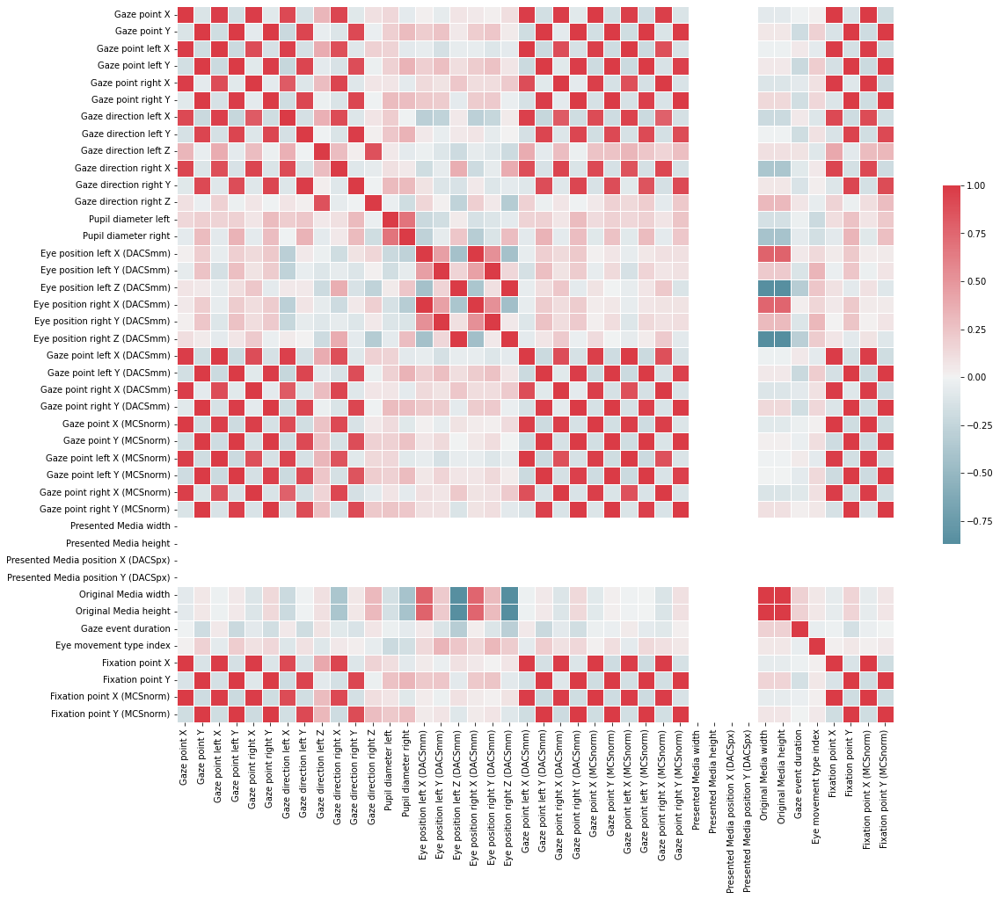

In [18]:
#using heatmap we are trying to see the correlation between columns
corr = sample_df3.corr()

f, ax = plt.subplots(figsize=(20, 15))

cmap = sns.diverging_palette(220, 10, as_cmap=True)

sns.heatmap(corr, cmap=cmap, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.show()

In [18]:
# we are finding the correlation between the columns with a threashold of 0.8
import pandas as pd


corr_matrix = sample_df3.corr()

corr_threshold = 0.8
corr_pairs = []
for col1 in corr_matrix.columns:
    for col2 in corr_matrix.columns:
        if col1 != col2 and abs(corr_matrix.loc[col1, col2]) > corr_threshold:
            corr_pairs.append((col1, col2))

corr_pairs


[('Gaze point X', 'Gaze point left X'),
 ('Gaze point X', 'Gaze point right X'),
 ('Gaze point X', 'Gaze direction left X'),
 ('Gaze point X', 'Gaze direction right X'),
 ('Gaze point X', 'Gaze point left X (DACSmm)'),
 ('Gaze point X', 'Gaze point right X (DACSmm)'),
 ('Gaze point X', 'Gaze point X (MCSnorm)'),
 ('Gaze point X', 'Gaze point left X (MCSnorm)'),
 ('Gaze point X', 'Gaze point right X (MCSnorm)'),
 ('Gaze point X', 'Fixation point X'),
 ('Gaze point X', 'Fixation point X (MCSnorm)'),
 ('Gaze point Y', 'Gaze point left Y'),
 ('Gaze point Y', 'Gaze point right Y'),
 ('Gaze point Y', 'Gaze direction left Y'),
 ('Gaze point Y', 'Gaze direction right Y'),
 ('Gaze point Y', 'Gaze point left Y (DACSmm)'),
 ('Gaze point Y', 'Gaze point right Y (DACSmm)'),
 ('Gaze point Y', 'Gaze point Y (MCSnorm)'),
 ('Gaze point Y', 'Gaze point left Y (MCSnorm)'),
 ('Gaze point Y', 'Gaze point right Y (MCSnorm)'),
 ('Gaze point Y', 'Fixation point Y'),
 ('Gaze point Y', 'Fixation point Y (MCSnor

We have observed that above columns has high correlation with each other like Gaze point X with Gaze point left X and so on..

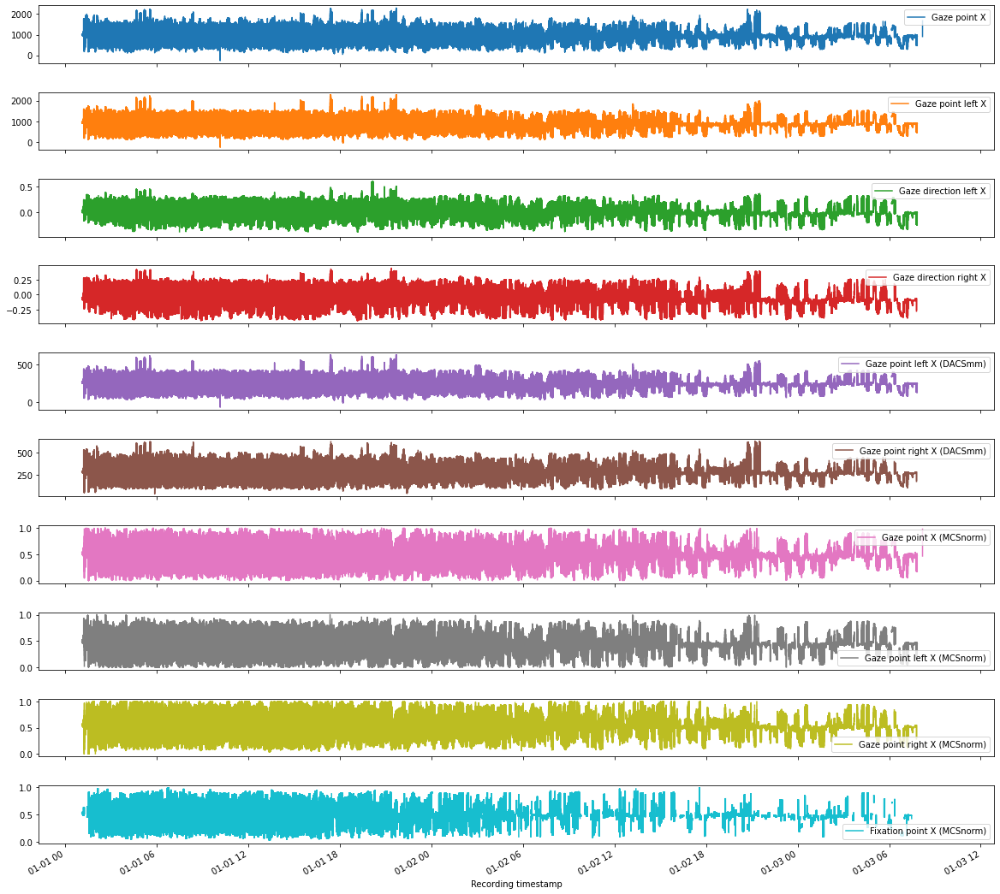

In [20]:
# we are plotting the data to check the relationship between ['Gaze point X'] with ['Gaze point left X','Gaze direction left X','Gaze direction right X','Gaze point left X (DACSmm)',
#                    'Gaze point right X (DACSmm)','Gaze point X (MCSnorm)','Gaze point left X (MCSnorm)','Gaze point right X (MCSnorm)',
#                   'Fixation point X (MCSnorm)']

show_data = sample_df3[['Gaze point X','Gaze point left X','Gaze direction left X','Gaze direction right X','Gaze point left X (DACSmm)',
                   'Gaze point right X (DACSmm)','Gaze point X (MCSnorm)','Gaze point left X (MCSnorm)','Gaze point right X (MCSnorm)',
                   'Fixation point X (MCSnorm)']]

show_data.plot(subplots=True, figsize=(20, 20))
plt.subplots_adjust(hspace=0.5)


As we seen that above graphs showing somehow the same patterns between each other but there are some missing values in this which effect the pattern of the graph as it clearly can be seen in the last graph we need to do some imputation to remove missing values

In [19]:
# lets check how many total missing data we have

miss_count = sample_df3.isna().sum()
total_na = miss_count.sum()
print(f'Total NaN values: {total_na}')


Total NaN values: 8227590


we have total 8227590 missing data now we fill those NaN values with backward and forward fill technique

In [20]:
#we are doing imputation to remove the missing data by backward and forward fill technique
sample_df3.interpolate(method='ffill', inplace=True)
sample_df3.interpolate(method='bfill', inplace=True)

In [21]:
# lets check again how many total missing data we have

miss_count = sample_df3.isna().sum()
total_na = miss_count.sum()
print(f'Total NaN values: {total_na}')


Total NaN values: 0


now its clearly seen that we have no missing data therefore we are plotting sub plots again to see the trend

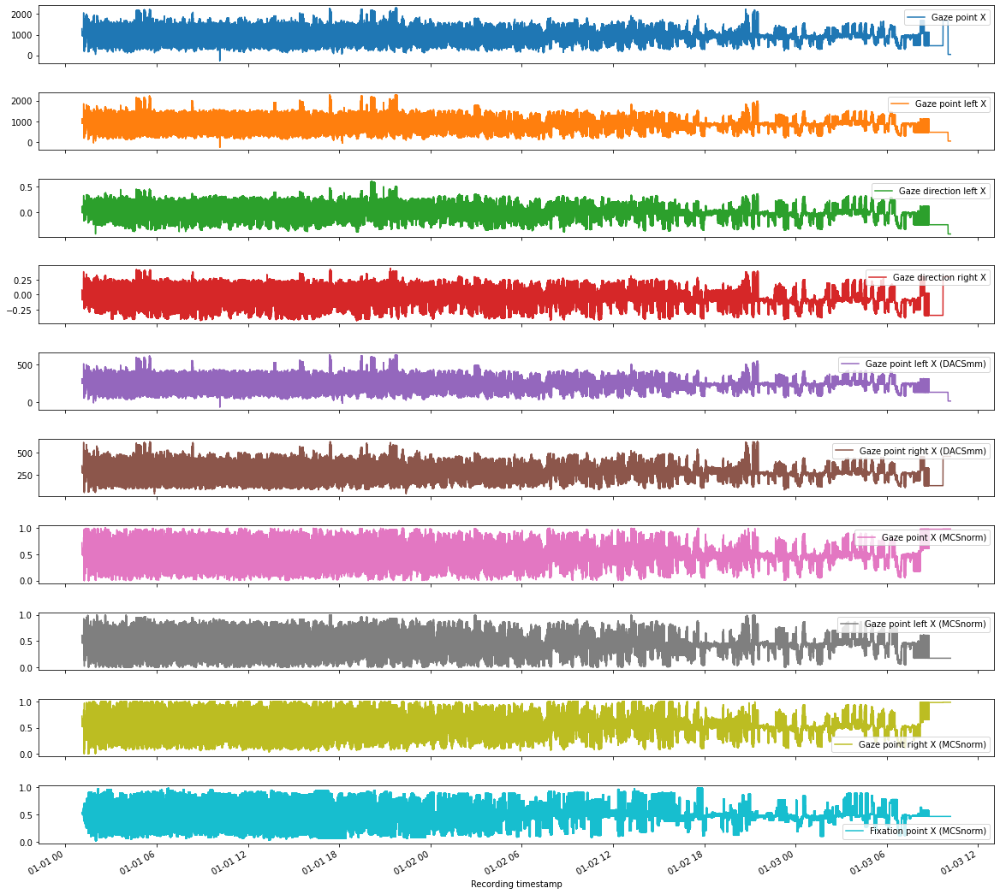

In [24]:
# we are plotting the data to check the relationship between ['Gaze point X'] with ['Gaze point left X','Gaze direction left X','Gaze direction right X','Gaze point left X (DACSmm)',
#                    'Gaze point right X (DACSmm)','Gaze point X (MCSnorm)','Gaze point left X (MCSnorm)','Gaze point right X (MCSnorm)',
#                   'Fixation point X (MCSnorm)']

show_data = sample_df3[['Gaze point X','Gaze point left X','Gaze direction left X','Gaze direction right X','Gaze point left X (DACSmm)',
                   'Gaze point right X (DACSmm)','Gaze point X (MCSnorm)','Gaze point left X (MCSnorm)','Gaze point right X (MCSnorm)',
                   'Fixation point X (MCSnorm)']]

show_data.plot(subplots=True, figsize=(20, 20))
plt.subplots_adjust(hspace=0.5)


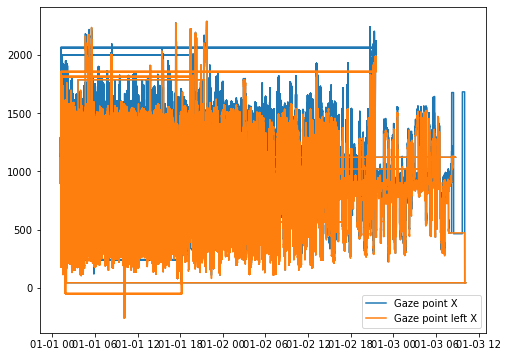

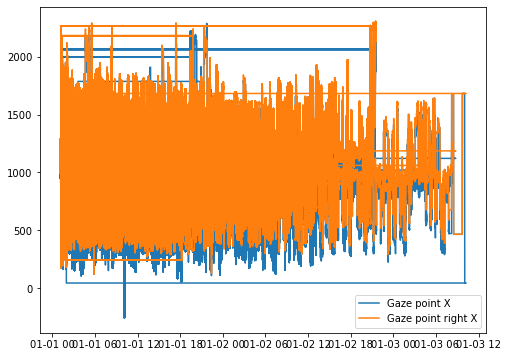

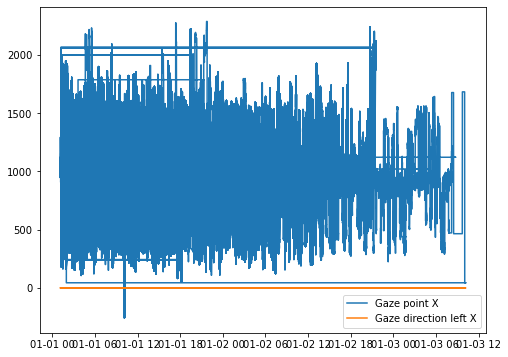

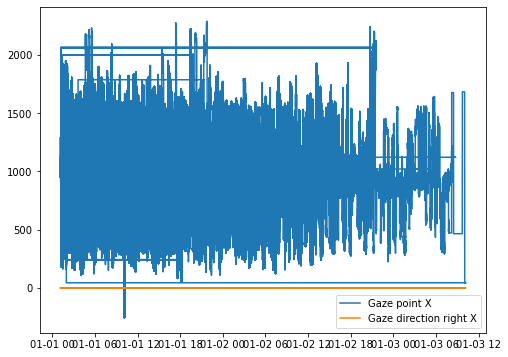

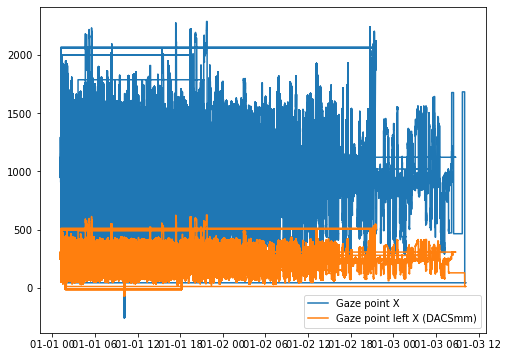

...

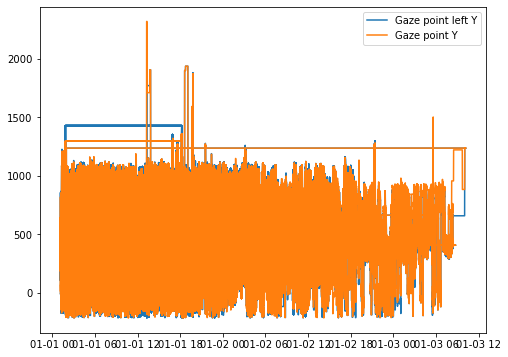

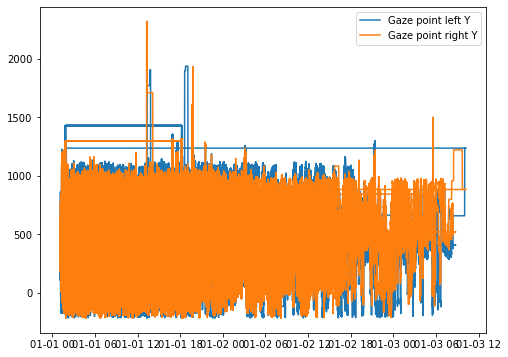

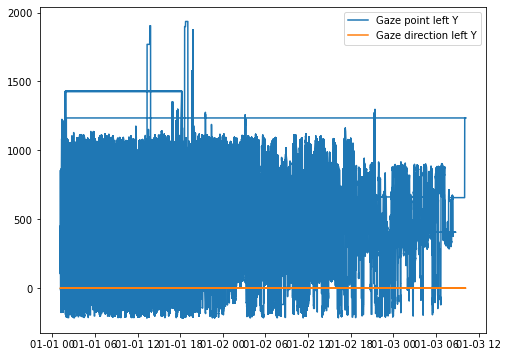

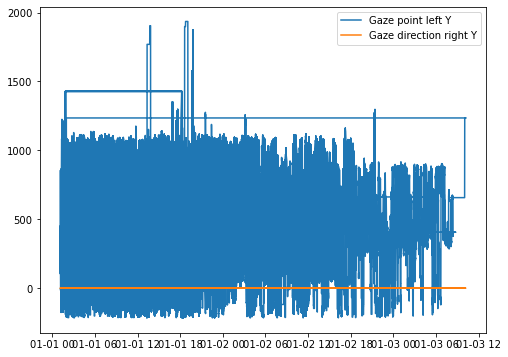

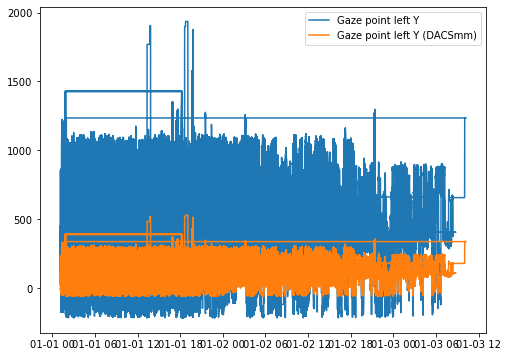

In [ ]:
# finding the columns that have the highest correlation with other columns

corr_matrix3 = sample_df3.corr()

corr_threshold = 0.8

corr_pairs3 = []
for col1 in corr_matrix.columns:
    for col2 in corr_matrix.columns:
        if col1 != col2 and abs(corr_matrix.loc[col1, col2]) > corr_threshold:
            corr_pairs3.append((col1, col2))

for pair in corr_pairs3:
    plt.plot(sample_df3[pair[0]], label=pair[0])
    plt.plot(sample_df3[pair[1]], label=pair[1])
    plt.legend()
    plt.show()


The above plots are showing the trend between each other and it is ploted based on the pairs of columns which are correlated with each other this is showing the change in value of one effects on other value or not

In [22]:
sample_df3['Participant name'].unique()

array(['Participant0001', 'Participant0003', 'Participant0013',
       'Participant0005'], dtype=object)

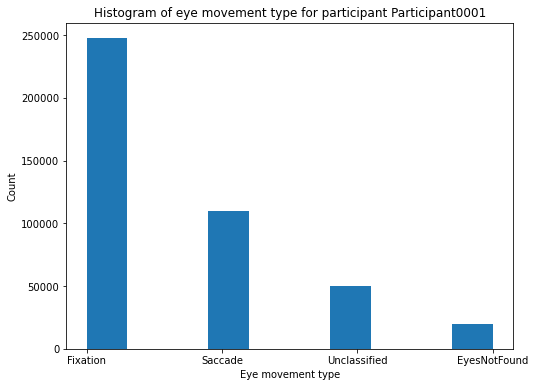

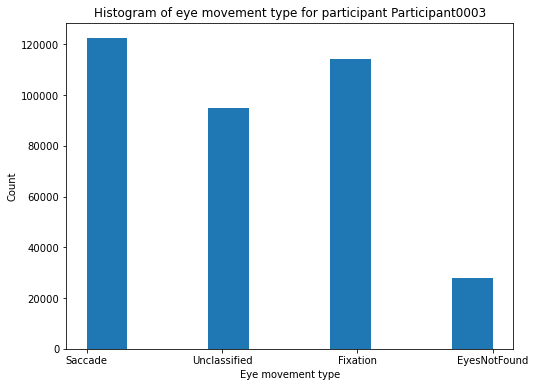

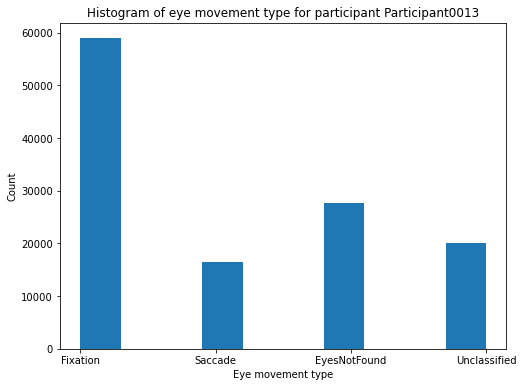

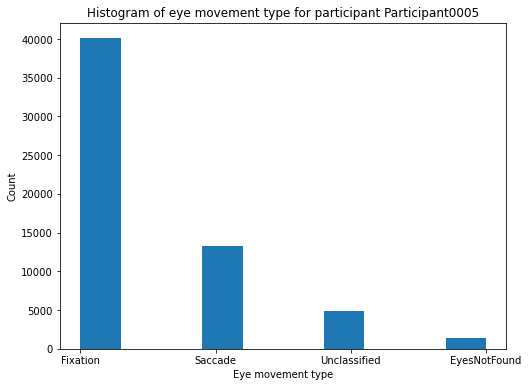

In [23]:
#we are finding the count of eye movement type occur for each participant

participant_col = 'Participant name'

participants = sample_df3[participant_col].unique()

for participant in participants:
    participant_rows = sample_df3[sample_df3[participant_col] == participant]
    
    plt.hist(participant_rows['Eye movement type'])
    plt.title(f"Histogram of eye movement type for participant {participant}")
    plt.xlabel('Eye movement type')
    plt.ylabel('Count')
    plt.show()


It can be clearly seen that only participant 3 had high saccade over fixation and rest of participant done maximum fixation it means they take maximum time in writting the information.

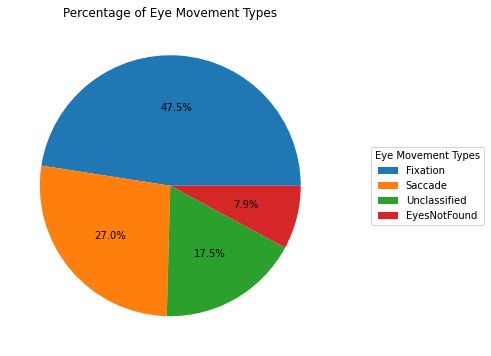

In [24]:
eye_movement_counts = sample_df3['Eye movement type'].value_counts()

plt.pie(eye_movement_counts, labels=None, autopct='%1.1f%%')

plt.legend(eye_movement_counts.index, title='Eye Movement Types', loc='center left', bbox_to_anchor=(1.1, 0.5))

plt.title('Percentage of Eye Movement Types')

plt.show()


above pie chart is showing that the maximum fixation occur 47.5% whereas 27.0% sacade occur

The dataset II in which people asked to identify the objects or shapes from an image in this dataset people are maximum time doing fixation which means they are observing more to absorbed the information rather than saccade (fixation occur 57.5% whereas 19.0% sacade occur) meanwhile we also found that the most columns have strong correlation with each other.

The dataset III in which people asked to use their eye movements on the letter to write a sentences in this dataset also fixation occur the most which means peoplea are observing more this dataset has few large columns correlated with each other compare to datasetII and also it was experience that the patterns of eye is different as compared to dataset II

working on questionaire dataset

In [58]:

questions1A = pd.read_csv('E:/dataset_project/empathy/EyeT/questions/Questionnaire_datasetIA.csv', encoding= 'unicode_escape')
question1B = pd.read_csv('E:/dataset_project/empathy/EyeT/questions/Questionnaire_datasetIA.csv', encoding= 'unicode_escape')

## Working on Question1A

In [59]:
df1 = questions1A.copy()

In [60]:
df1.head()

,Participant nr,NR,Created,Modified,I have read and understood the information about the study and all the information in this form is explained to me and I am willing to participate,I want to participate.,I sometimes find it difficult to see things from the other guys point of view.,"I am usually objective when I watch a film or play, and I dont often get completely caught up in it.",I try to look at everybodys side of a disagreement before I make a decision.,I sometimes try to understand my friends better by imagining how things look from their perspective.,...,"If someone is suffering from stutter, I prefer speaking rather than texting.",I try to be patient when people speak with me very slowly.,"In a situation, when there are handicapped students in a classroom, the pace of the class should be adapted to the handicapped student.","In a situation, when there are only one handicapped student in a classroom, the pace of the class should be adapted to him/her independently of how many students are in the class.","I feel impatient when people communicate slowly, so I complete other peoples sentences to make the communication more efficient.",I believe that the handicapped students should catch the pace of the group in a classroom to not delay the progress of other students.,I feel left out (or excluded) when I cannot participate in a conversation.,Total Score extended,Total Score original,Elapsed time
0,1,9199452,07.09.2020 15:13,07.09.2020 15:13,Yes,Proceed,3,3,4,4,...,1,4,4,4,1,3,4,134,108,5 minutes 5 seconds
1,2,9584002,30.09.2020 11:23,30.09.2020 11:23,Yes,Proceed,3,3,4,4,...,2,4,3,3,4,2,2,133,105,5 minutes 55 seconds
2,3,9112363,02.09.2020 09:17,02.09.2020 09:17,Yes,Proceed,2,2,3,4,...,3,3,3,3,3,3,3,116,81,6 minutes 49 seconds
3,4,9727754,06.10.2020 13:20,06.10.2020 13:20,Yes,Proceed,2,3,4,3,...,2,3,4,4,2,4,2,114,96,8 minutes 39 seconds
4,5,9730232,06.10.2020 14:53,06.10.2020 14:53,Yes,Proceed,3,3,4,4,...,1,4,2,1,4,4,4,138,106,7 minutes 27 seconds


In [61]:
df1.shape

(60, 49)

we have 60 rows and 49 columns

In [62]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60 entries, 0 to 59
Data columns (total 49 columns):
 #   Column                                                                                                                                                                               Non-Null Count  Dtype 
---  ------                                                                                                                                                                               --------------  ----- 
 0   Participant nr                                                                                                                                                                       60 non-null     int64 
 1   NR                                                                                                                                                                                   60 non-null     int64 
 2   Created                                                 

### Finding Missing Values


In [63]:
# lets check how many total missing data we have

miss_count = df1.isna().sum()
total_na = miss_count.sum()
print(f'Total NaN values: {total_na}')


Total NaN values: 0


In this dataset we do not have any missing value

In [64]:
#finding how many columns has non-changing value
cols = []

for col in df1.columns:
    if df1[col].nunique() == 1:
        cols.append(col)

print("Columns with non-changing values:", cols)


Columns with non-changing values: ['I have read and understood the information about the study and all the information in this form is explained to me and I am willing to participate', 'I want to participate.']


In [65]:
#Removing these columns which has no change
df1 = df1.drop(['I have read and understood the information about the study and all the information in this form is explained to me and I am willing to participate', 'I want to participate.'], axis=1)
df1.head()

,Participant nr,NR,Created,Modified,I sometimes find it difficult to see things from the other guys point of view.,"I am usually objective when I watch a film or play, and I dont often get completely caught up in it.",I try to look at everybodys side of a disagreement before I make a decision.,I sometimes try to understand my friends better by imagining how things look from their perspective.,"When I am upset at someone, I usually try to put myself in his shoes for a while.","Before criticising somebody, I try to imagine how I would feel if I was in their place.",...,"If someone is suffering from stutter, I prefer speaking rather than texting.",I try to be patient when people speak with me very slowly.,"In a situation, when there are handicapped students in a classroom, the pace of the class should be adapted to the handicapped student.","In a situation, when there are only one handicapped student in a classroom, the pace of the class should be adapted to him/her independently of how many students are in the class.","I feel impatient when people communicate slowly, so I complete other peoples sentences to make the communication more efficient.",I believe that the handicapped students should catch the pace of the group in a classroom to not delay the progress of other students.,I feel left out (or excluded) when I cannot participate in a conversation.,Total Score extended,Total Score original,Elapsed time
0,1,9199452,07.09.2020 15:13,07.09.2020 15:13,3,3,4,4,3,4,...,1,4,4,4,1,3,4,134,108,5 minutes 5 seconds
1,2,9584002,30.09.2020 11:23,30.09.2020 11:23,3,3,4,4,4,3,...,2,4,3,3,4,2,2,133,105,5 minutes 55 seconds
2,3,9112363,02.09.2020 09:17,02.09.2020 09:17,2,2,3,4,3,3,...,3,3,3,3,3,3,3,116,81,6 minutes 49 seconds
3,4,9727754,06.10.2020 13:20,06.10.2020 13:20,2,3,4,3,2,4,...,2,3,4,4,2,4,2,114,96,8 minutes 39 seconds
4,5,9730232,06.10.2020 14:53,06.10.2020 14:53,3,3,4,4,3,4,...,1,4,2,1,4,4,4,138,106,7 minutes 27 seconds


In [66]:
df1.columns

Index(['Participant nr', 'NR', 'Created', 'Modified',
       'I sometimes find it difficult to see things from the other guys point of view.',
       'I am usually objective when I watch a film or play, and I dont often get completely caught up in it.',
       'I try to look at everybodys side of a disagreement before I make a decision.',
       'I sometimes try to understand my friends better by imagining how things look from their perspective.',
       'When I am upset at someone, I usually try to put myself in his shoes for a while.',
       'Before criticising somebody, I try to imagine how I would feel if I was in their place.',
       'I often get emotionally involved with my friends problems.',
       'I am inclined to get nervous when others around me seem to be nervous.',
       'People I am with have a strong influence on my mood.',
       'It affects me very much when one of my friends seems upset.',
       'I often get deeply involved with the feelings of a character

In [67]:
col = df1.iloc[:, 4:44]
column_name = col.columns
print(column_name)

Index(['I sometimes find it difficult to see things from the other guys point of view.',
       'I am usually objective when I watch a film or play, and I dont often get completely caught up in it.',
       'I try to look at everybodys side of a disagreement before I make a decision.',
       'I sometimes try to understand my friends better by imagining how things look from their perspective.',
       'When I am upset at someone, I usually try to put myself in his shoes for a while.',
       'Before criticising somebody, I try to imagine how I would feel if I was in their place.',
       'I often get emotionally involved with my friends problems.',
       'I am inclined to get nervous when others around me seem to be nervous.',
       'People I am with have a strong influence on my mood.',
       'It affects me very much when one of my friends seems upset.',
       'I often get deeply involved with the feelings of a character in a film, play or novel.',
       'I get very upset 

In [68]:
colum_stat = df1.describe()

print(colum_stat)

       Participant nr            NR  \
count       60.000000  6.000000e+01   
mean        30.500000  1.254747e+07   
std         17.464249  2.213064e+06   
min          1.000000  9.111416e+06   
25%         15.750000  1.091565e+07   
50%         30.500000  1.240955e+07   
75%         45.250000  1.373001e+07   
max         60.000000  1.601652e+07   

       I sometimes find it difficult to see things from the other guys point of view.  \
count                                          60.000000                                   
mean                                            2.316667                                   
std                                             0.965361                                   
min                                             1.000000                                   
25%                                             2.000000                                   
50%                                             2.000000                                   
75% 

C:\Users\Rizwan\anaconda3\lib\site-packages\seaborn\utils.py:95: UserWarning: Glyph 145 (\x91) missing from current font.
  fig.canvas.draw()
C:\Users\Rizwan\anaconda3\lib\site-packages\seaborn\utils.py:95: UserWarning: Glyph 146 (\x92) missing from current font.
  fig.canvas.draw()
C:\Users\Rizwan\anaconda3\lib\site-packages\seaborn\utils.py:660: UserWarning: Glyph 145 (\x91) missing from current font.
  bboxes = [l.get_window_extent() for l in labels]
C:\Users\Rizwan\anaconda3\lib\site-packages\seaborn\utils.py:660: UserWarning: Glyph 146 (\x92) missing from current font.
  bboxes = [l.get_window_extent() for l in labels]
C:\Users\Rizwan\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 145 (\x91) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\Rizwan\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 146 (\x92) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


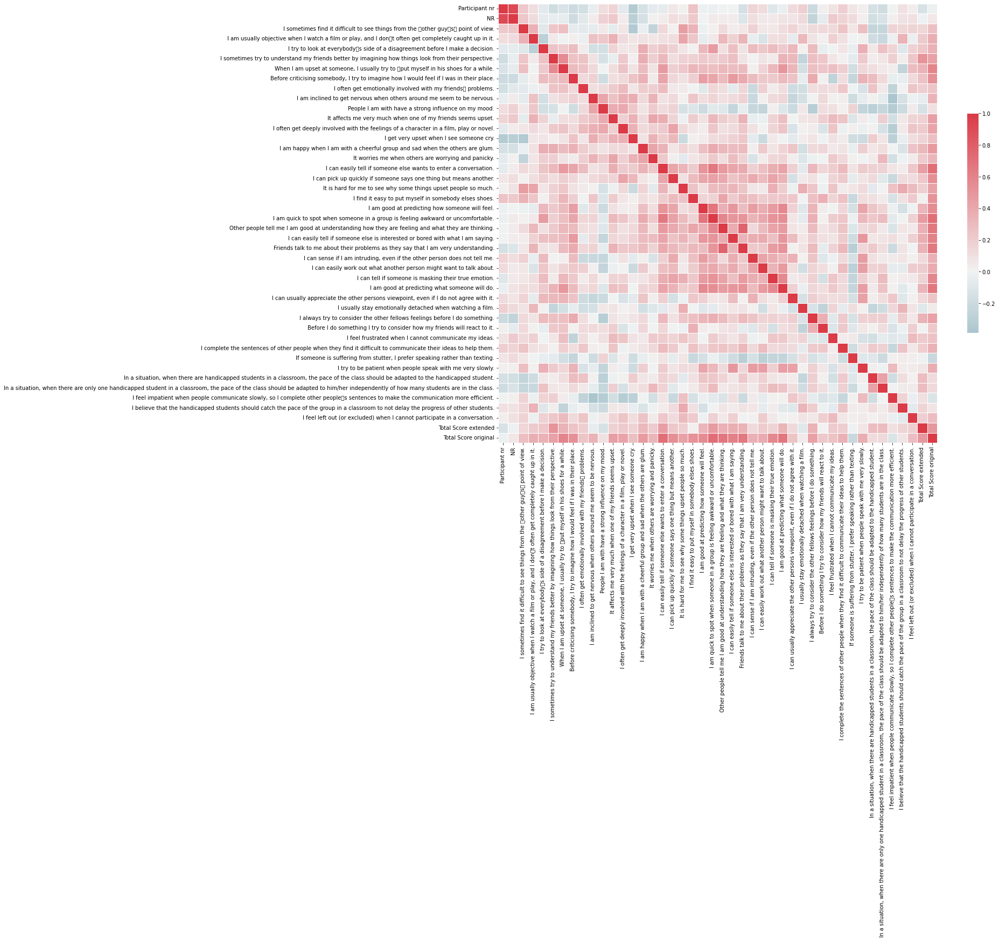

In [69]:
#using heatmap we are trying to see the correlation between columns
corr = df1.corr()

f, ax = plt.subplots(figsize=(20, 15))

cmap = sns.diverging_palette(220, 10, as_cmap=True)

sns.heatmap(corr, cmap=cmap, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.show()

In this correlation matrix it is clearly seen that the one question rating has the same relation with others for example: ['People I am with have a strong influence on my mood']. is having strong correlation with ['I am inclined to get nervous when others around me seem to be nervous.']

C:\Users\Rizwan\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 145 (\x91) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\Rizwan\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 146 (\x92) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


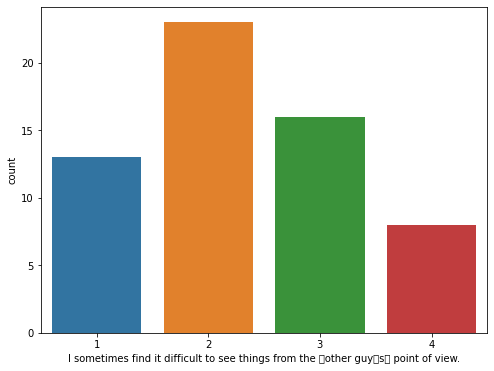

C:\Users\Rizwan\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 146 (\x92) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


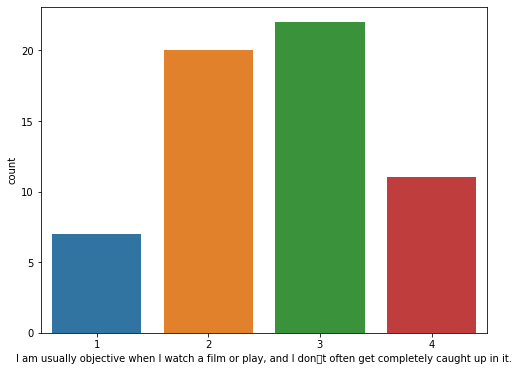

C:\Users\Rizwan\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 146 (\x92) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


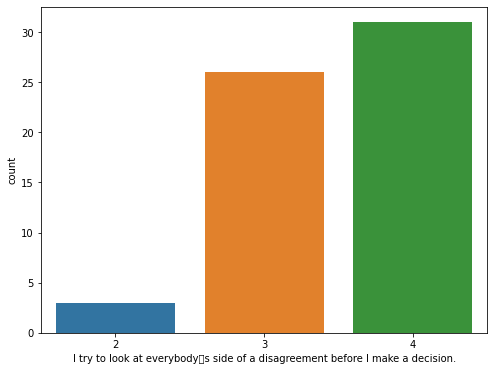

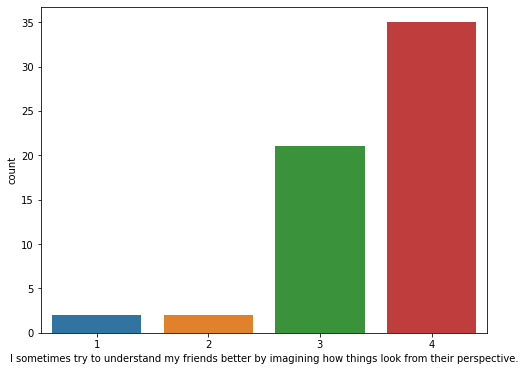

C:\Users\Rizwan\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 145 (\x91) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


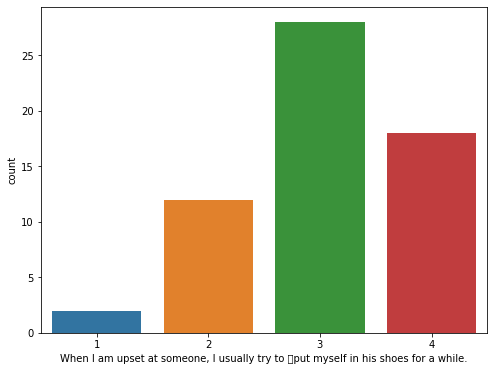

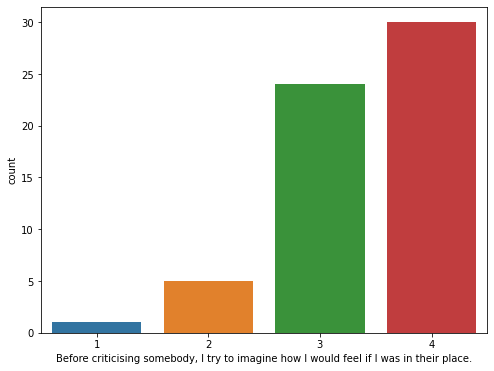

C:\Users\Rizwan\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 146 (\x92) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


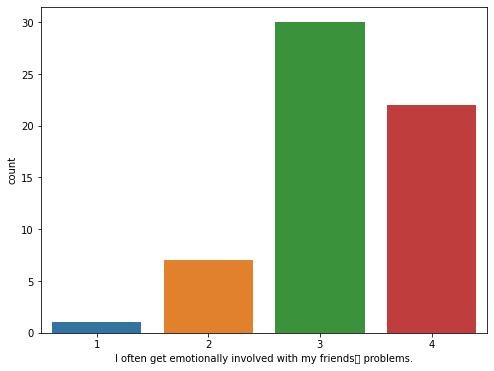

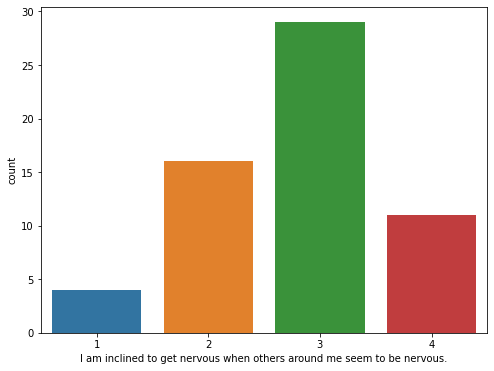

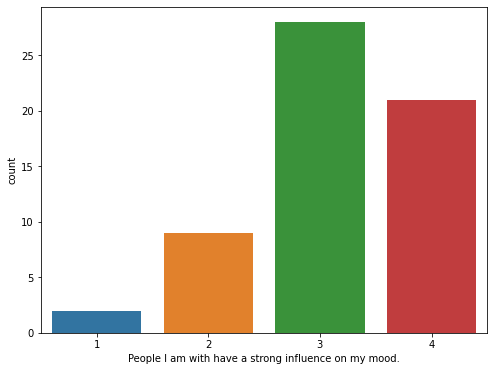

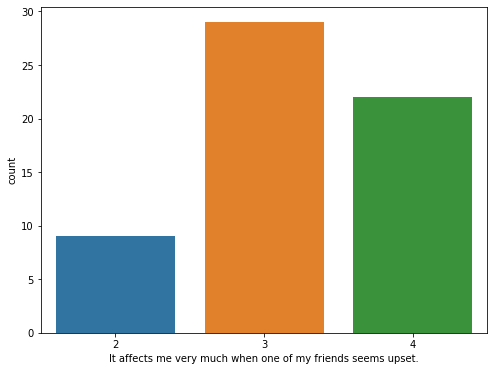

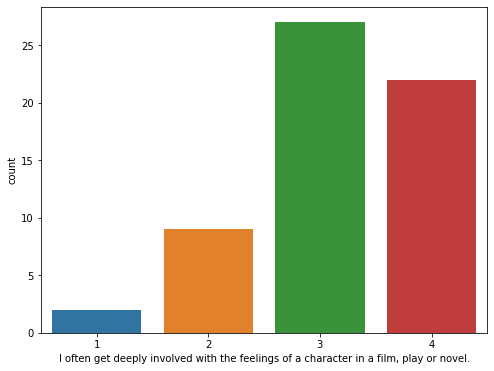

...

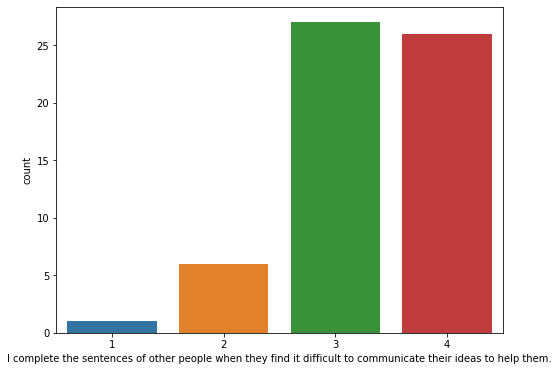

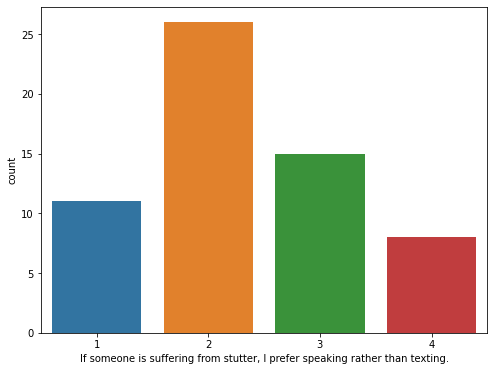

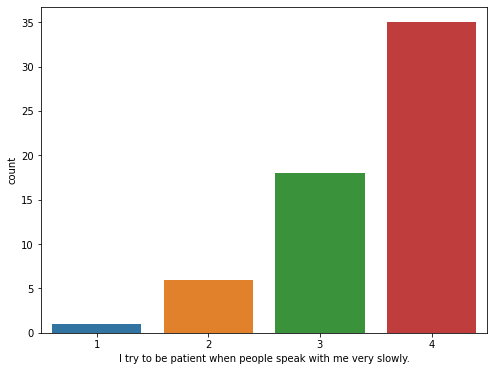

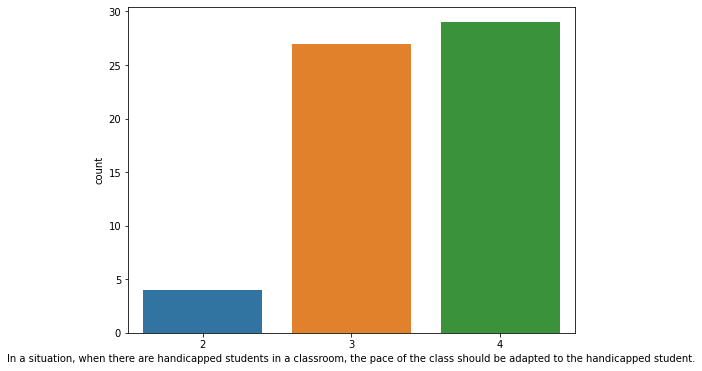

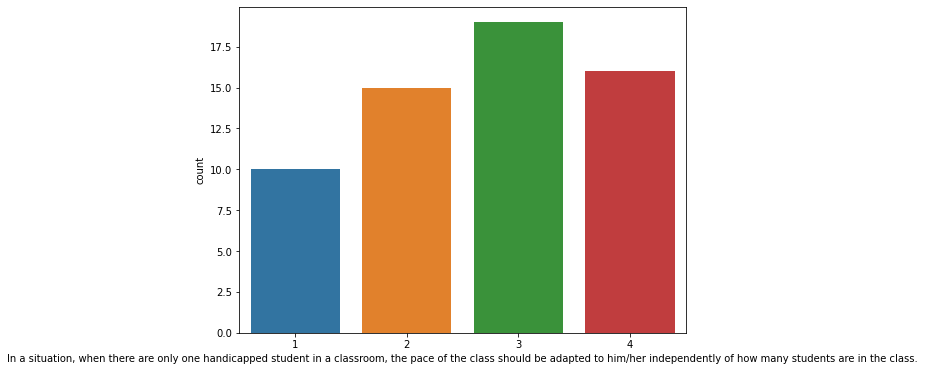

C:\Users\Rizwan\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 146 (\x92) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


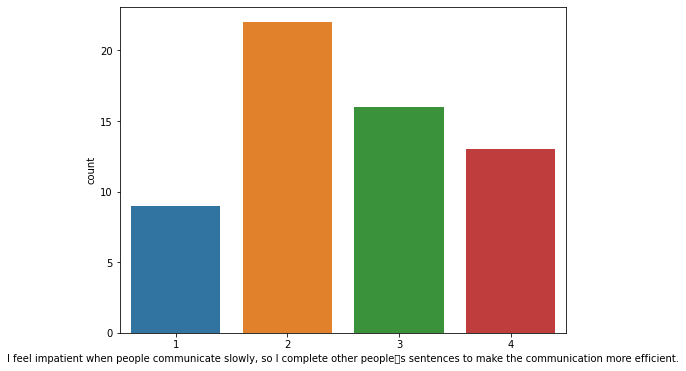

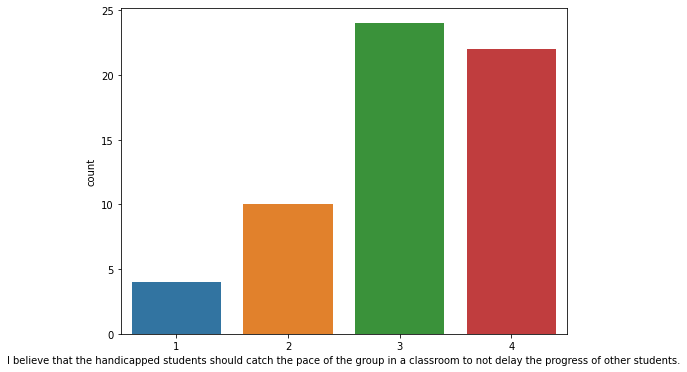

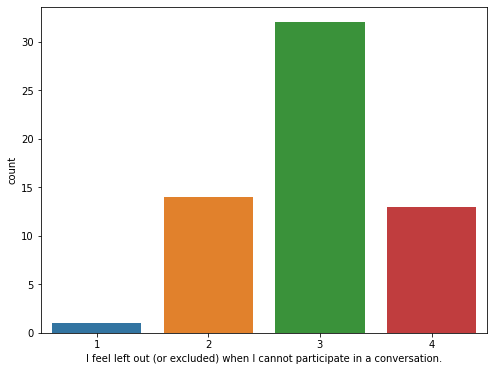

In [70]:
#plotting a count plot to see how much rating frequency belongs to each question

col = df1.iloc[:, 4:44]
column_name = col.columns


for col in column_name:
    sns.countplot(x=col, data=df1)
    plt.show()


Above count plot showing the count of ratings belongs to each questions

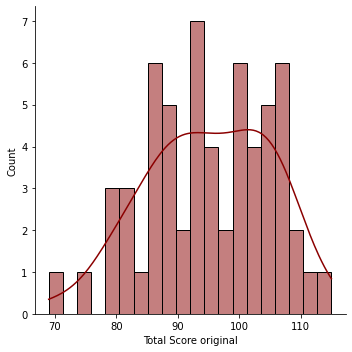

In [71]:
sns.displot(df1['Total Score original'],kde=True,color='darkred',bins=20)
plt.show()

Total Score original is not normally distributed

## Working on Question1B

In [72]:
df2 = question1B.copy()

In [73]:
df2.head()

,Participant nr,NR,Created,Modified,I have read and understood the information about the study and all the information in this form is explained to me and I am willing to participate,I want to participate.,I sometimes find it difficult to see things from the other guys point of view.,"I am usually objective when I watch a film or play, and I dont often get completely caught up in it.",I try to look at everybodys side of a disagreement before I make a decision.,I sometimes try to understand my friends better by imagining how things look from their perspective.,...,"If someone is suffering from stutter, I prefer speaking rather than texting.",I try to be patient when people speak with me very slowly.,"In a situation, when there are handicapped students in a classroom, the pace of the class should be adapted to the handicapped student.","In a situation, when there are only one handicapped student in a classroom, the pace of the class should be adapted to him/her independently of how many students are in the class.","I feel impatient when people communicate slowly, so I complete other peoples sentences to make the communication more efficient.",I believe that the handicapped students should catch the pace of the group in a classroom to not delay the progress of other students.,I feel left out (or excluded) when I cannot participate in a conversation.,Total Score extended,Total Score original,Elapsed time
0,1,9199452,07.09.2020 15:13,07.09.2020 15:13,Yes,Proceed,3,3,4,4,...,1,4,4,4,1,3,4,134,108,5 minutes 5 seconds
1,2,9584002,30.09.2020 11:23,30.09.2020 11:23,Yes,Proceed,3,3,4,4,...,2,4,3,3,4,2,2,133,105,5 minutes 55 seconds
2,3,9112363,02.09.2020 09:17,02.09.2020 09:17,Yes,Proceed,2,2,3,4,...,3,3,3,3,3,3,3,116,81,6 minutes 49 seconds
3,4,9727754,06.10.2020 13:20,06.10.2020 13:20,Yes,Proceed,2,3,4,3,...,2,3,4,4,2,4,2,114,96,8 minutes 39 seconds
4,5,9730232,06.10.2020 14:53,06.10.2020 14:53,Yes,Proceed,3,3,4,4,...,1,4,2,1,4,4,4,138,106,7 minutes 27 seconds


In [74]:
df2.shape

(60, 49)

we have 60 rows and 49 columns

In [75]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60 entries, 0 to 59
Data columns (total 49 columns):
 #   Column                                                                                                                                                                               Non-Null Count  Dtype 
---  ------                                                                                                                                                                               --------------  ----- 
 0   Participant nr                                                                                                                                                                       60 non-null     int64 
 1   NR                                                                                                                                                                                   60 non-null     int64 
 2   Created                                                 

### Finding Missing Values

In [76]:
# lets check how many total missing data we have

miss_count = df2.isna().sum()
total_na = miss_count.sum()
print(f'Total NaN values: {total_na}')


Total NaN values: 0


In this dataset we do not have any missing value

In [77]:
#finding how many columns has non-changing value

cols = []
for col in df2.columns:
    if df2[col].nunique() == 1:
        cols.append(col)

print("Columns with non-changing values:", cols)


Columns with non-changing values: ['I have read and understood the information about the study and all the information in this form is explained to me and I am willing to participate', 'I want to participate.']


In [78]:
#Removing these columns which has no change
df2 = df2.drop(['I have read and understood the information about the study and all the information in this form is explained to me and I am willing to participate', 'I want to participate.'], axis=1)
df2.head()

,Participant nr,NR,Created,Modified,I sometimes find it difficult to see things from the other guys point of view.,"I am usually objective when I watch a film or play, and I dont often get completely caught up in it.",I try to look at everybodys side of a disagreement before I make a decision.,I sometimes try to understand my friends better by imagining how things look from their perspective.,"When I am upset at someone, I usually try to put myself in his shoes for a while.","Before criticising somebody, I try to imagine how I would feel if I was in their place.",...,"If someone is suffering from stutter, I prefer speaking rather than texting.",I try to be patient when people speak with me very slowly.,"In a situation, when there are handicapped students in a classroom, the pace of the class should be adapted to the handicapped student.","In a situation, when there are only one handicapped student in a classroom, the pace of the class should be adapted to him/her independently of how many students are in the class.","I feel impatient when people communicate slowly, so I complete other peoples sentences to make the communication more efficient.",I believe that the handicapped students should catch the pace of the group in a classroom to not delay the progress of other students.,I feel left out (or excluded) when I cannot participate in a conversation.,Total Score extended,Total Score original,Elapsed time
0,1,9199452,07.09.2020 15:13,07.09.2020 15:13,3,3,4,4,3,4,...,1,4,4,4,1,3,4,134,108,5 minutes 5 seconds
1,2,9584002,30.09.2020 11:23,30.09.2020 11:23,3,3,4,4,4,3,...,2,4,3,3,4,2,2,133,105,5 minutes 55 seconds
2,3,9112363,02.09.2020 09:17,02.09.2020 09:17,2,2,3,4,3,3,...,3,3,3,3,3,3,3,116,81,6 minutes 49 seconds
3,4,9727754,06.10.2020 13:20,06.10.2020 13:20,2,3,4,3,2,4,...,2,3,4,4,2,4,2,114,96,8 minutes 39 seconds
4,5,9730232,06.10.2020 14:53,06.10.2020 14:53,3,3,4,4,3,4,...,1,4,2,1,4,4,4,138,106,7 minutes 27 seconds


In [79]:
col = df2.iloc[:, 4:44]
column_name = col.columns
print(column_name)

Index(['I sometimes find it difficult to see things from the other guys point of view.',
       'I am usually objective when I watch a film or play, and I dont often get completely caught up in it.',
       'I try to look at everybodys side of a disagreement before I make a decision.',
       'I sometimes try to understand my friends better by imagining how things look from their perspective.',
       'When I am upset at someone, I usually try to put myself in his shoes for a while.',
       'Before criticising somebody, I try to imagine how I would feel if I was in their place.',
       'I often get emotionally involved with my friends problems.',
       'I am inclined to get nervous when others around me seem to be nervous.',
       'People I am with have a strong influence on my mood.',
       'It affects me very much when one of my friends seems upset.',
       'I often get deeply involved with the feelings of a character in a film, play or novel.',
       'I get very upset 

In [80]:
col_stats = df2.describe()

# Print results
print(col_stats)

       Participant nr            NR  \
count       60.000000  6.000000e+01   
mean        30.500000  1.254747e+07   
std         17.464249  2.213064e+06   
min          1.000000  9.111416e+06   
25%         15.750000  1.091565e+07   
50%         30.500000  1.240955e+07   
75%         45.250000  1.373001e+07   
max         60.000000  1.601652e+07   

       I sometimes find it difficult to see things from the other guys point of view.  \
count                                          60.000000                                   
mean                                            2.316667                                   
std                                             0.965361                                   
min                                             1.000000                                   
25%                                             2.000000                                   
50%                                             2.000000                                   
75% 

C:\Users\Rizwan\anaconda3\lib\site-packages\seaborn\utils.py:95: UserWarning: Glyph 145 (\x91) missing from current font.
  fig.canvas.draw()
C:\Users\Rizwan\anaconda3\lib\site-packages\seaborn\utils.py:95: UserWarning: Glyph 146 (\x92) missing from current font.
  fig.canvas.draw()
C:\Users\Rizwan\anaconda3\lib\site-packages\seaborn\utils.py:660: UserWarning: Glyph 145 (\x91) missing from current font.
  bboxes = [l.get_window_extent() for l in labels]
C:\Users\Rizwan\anaconda3\lib\site-packages\seaborn\utils.py:660: UserWarning: Glyph 146 (\x92) missing from current font.
  bboxes = [l.get_window_extent() for l in labels]
C:\Users\Rizwan\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 145 (\x91) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\Rizwan\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 146 (\x92) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


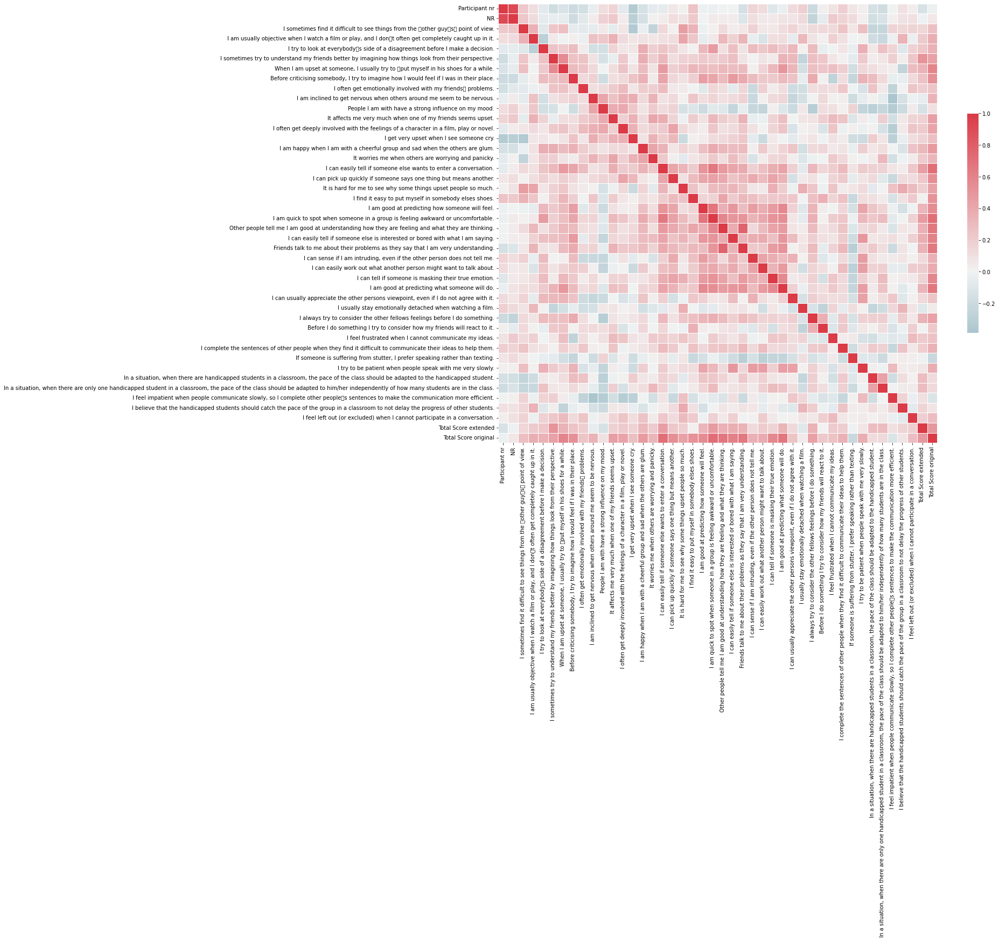

In [81]:
#using heatmap we are trying to see the correlation between columns
corr = df2.corr()

f, ax = plt.subplots(figsize=(20, 15))

cmap = sns.diverging_palette(220, 10, as_cmap=True)

sns.heatmap(corr, cmap=cmap, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.show()

C:\Users\Rizwan\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 145 (\x91) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\Rizwan\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 146 (\x92) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


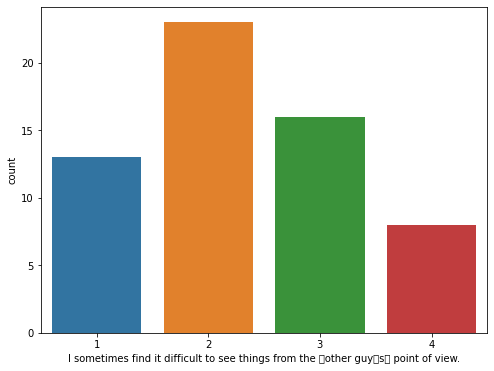

C:\Users\Rizwan\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 146 (\x92) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


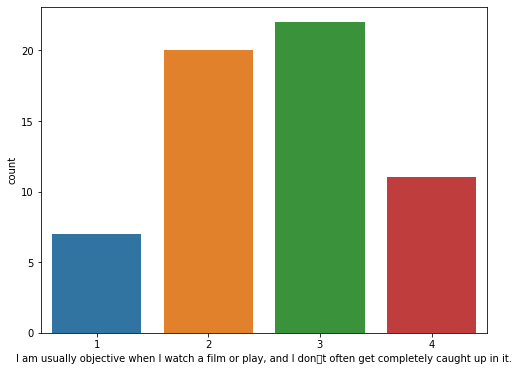

C:\Users\Rizwan\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 146 (\x92) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


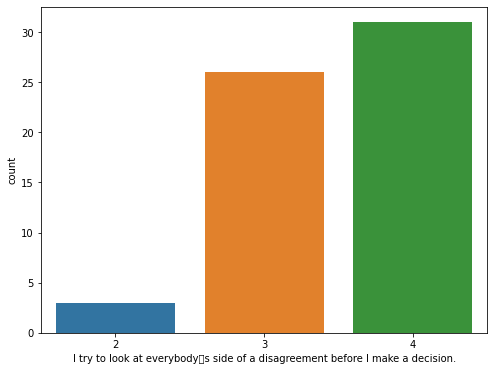

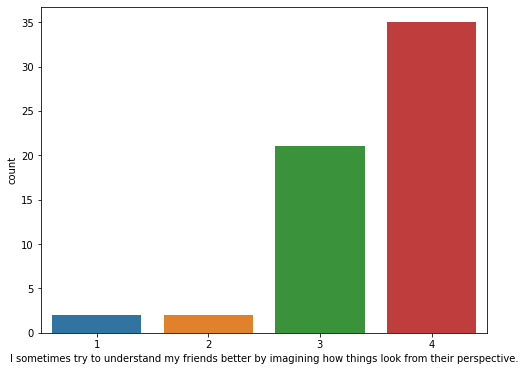

C:\Users\Rizwan\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 145 (\x91) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


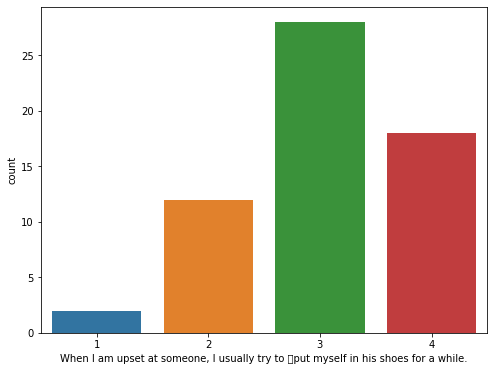

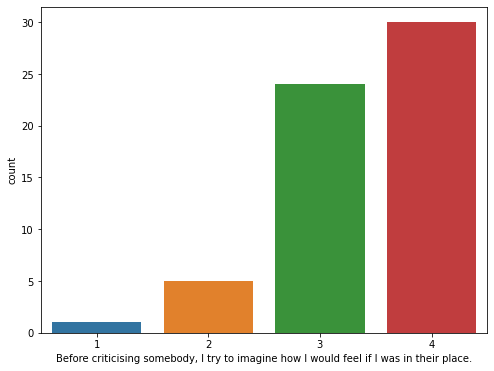

C:\Users\Rizwan\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 146 (\x92) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


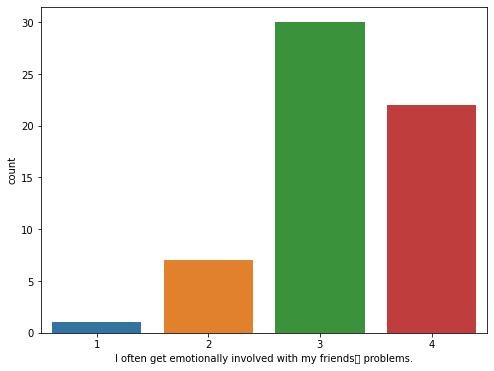

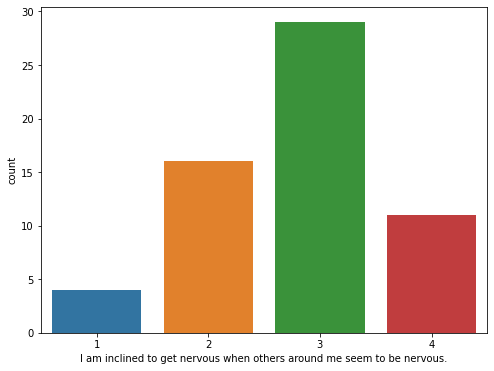

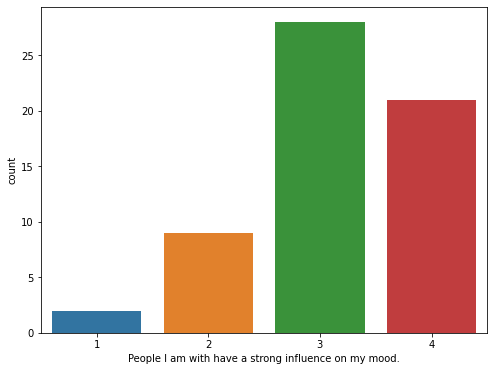

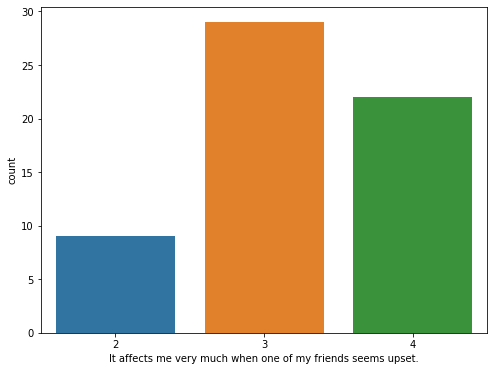

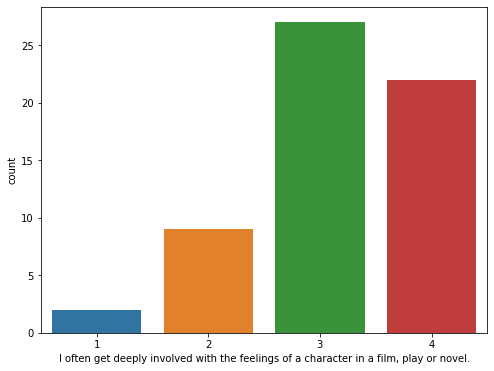

...

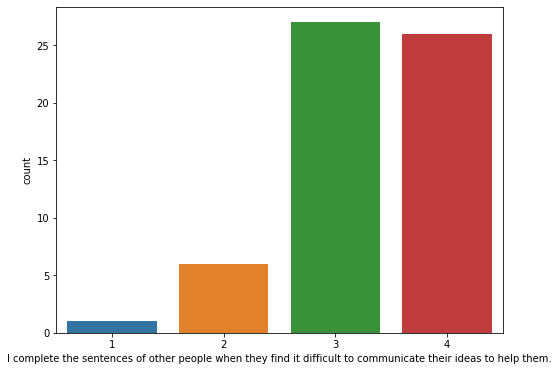

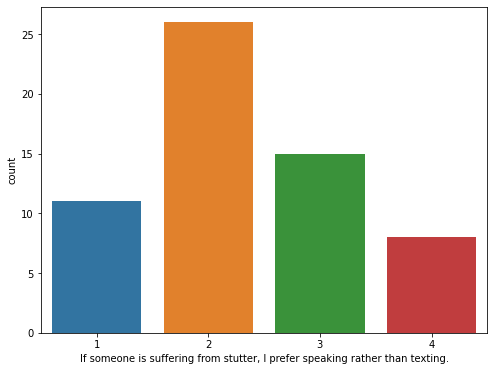

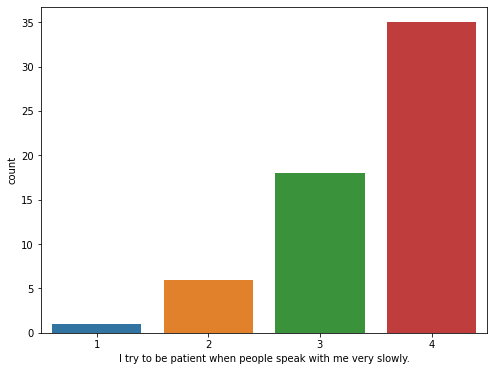

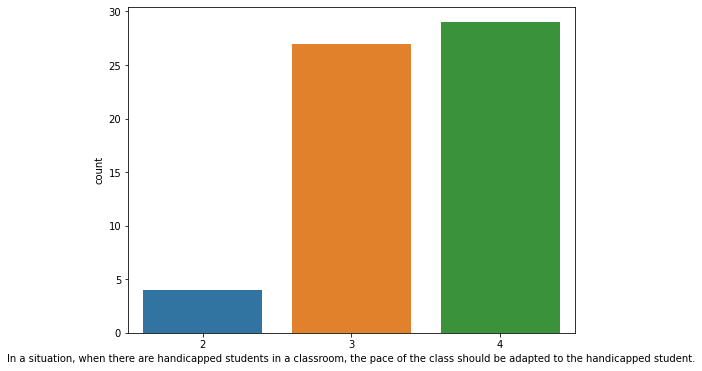

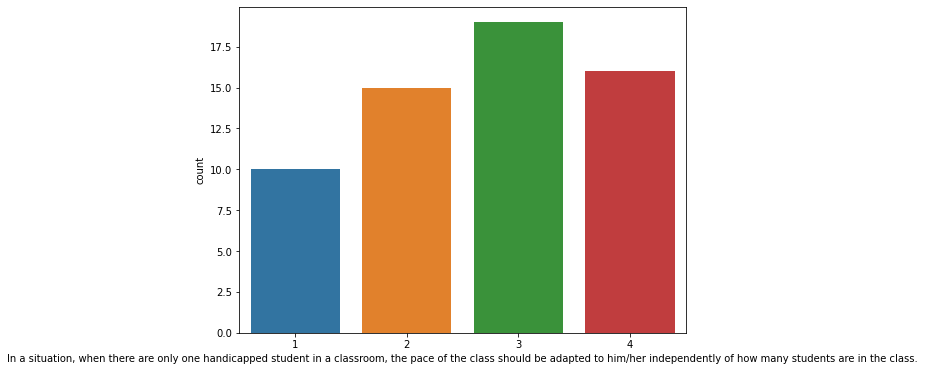

C:\Users\Rizwan\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 146 (\x92) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


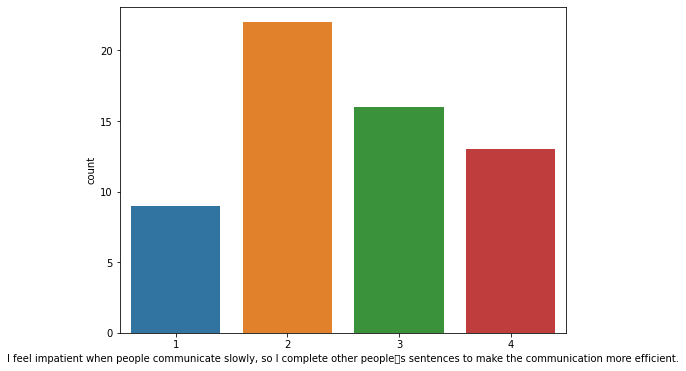

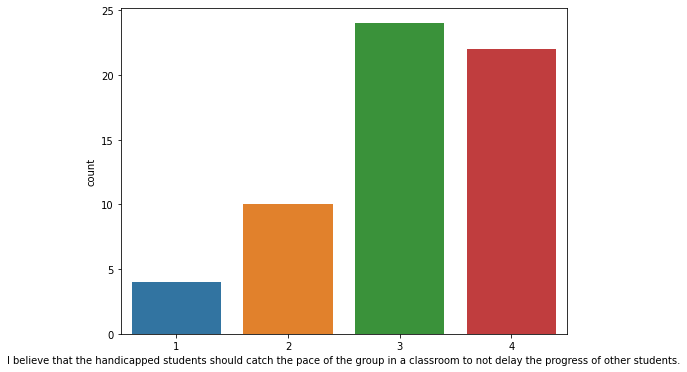

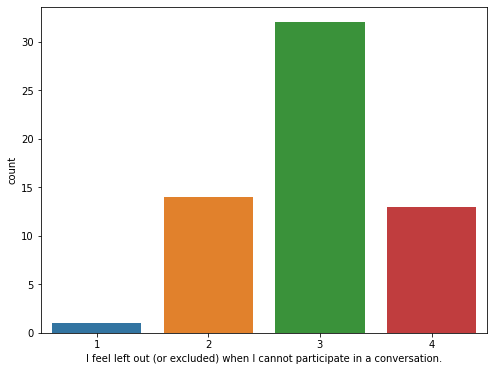

In [82]:
#plotting a count plot to see how much rating frequency belongs to each question

col = df2.iloc[:, 4:44]
column_name = col.columns


for col in column_name:
    sns.countplot(x=col, data=df2)
    plt.show()


Above count plot showing the count of ratings belongs to each questions

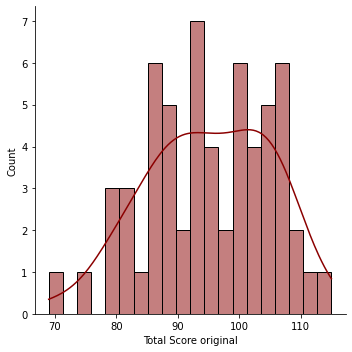

In [83]:
sns.displot(df2['Total Score original'],kde=True,color='darkred',bins=20)
plt.show()

Total Score original is not normally distributed

It is observed that before and after intervention the average values in questions are same but there is a high correaltion between one question to other for example:

['People I am with have a strong influence on my mood']. is having strong correlation with ['I am inclined to get nervous when others around me seem to be nervous.'] which might effect on the empathy score hence the questions which were asking can impact the empathy score.

Moreover the the movement of eye cordinates which we had explore before from datasetII and III can also be a good predictor for calculating Empathy score because they are highly correlated with each other we can try to build the model with the help of those cordinates to predict what type of questions is asking like the question is surprising, joying and stressfull based on that we can give the rating from 1 to 3 whether participant feel very surprising based on those rating we could able to calculate empathy score.